# **Setup**

In [1]:
import os.path as path
from urllib import request
import pandas as pd

In [2]:
# Download CSV file from public GDrive URL
dataset_url = 'https://drive.google.com/uc?id=1YE8wPvJEgom7JseX8ENcX7dgaIe7N3L2&export=download'
dataset_file = 'dataset.csv'

request.urlretrieve(dataset_url, dataset_file)

df = pd.read_csv(dataset_file)

# **Data Preprocessing**

## Inspecting Data

To begin, we first inspect the values in the dataset to see what steps need to be done and to better understand the context of our data.

In [3]:
# View a few rows from the dataset
df.head().append(df.tail())

/var/folders/w9/p29nm4ss7819x5vc_tckdd280000gn/T/ipykernel_98877/853911297.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df.head().append(df.tail())


,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Lanes_or_Medians,Types_of_Junction,Road_surface_type,Light_conditions,Weather_conditions,Type_of_collision,Vehicle_movement,Pedestrian_movement,Cause_of_accident,Accident_severity
0,18-30,Male,Above high school,Employee,1-2yr,Unknown,No junction,Asphalt roads,Daylight,Normal,Collision with roadside-parked vehicles,Going straight,Not a Pedestrian,Moving Backward,2
1,31-50,Male,Junior high school,Employee,Above 10yr,Undivided Two way,No junction,Asphalt roads,Daylight,Normal,Vehicle with vehicle collision,Going straight,Not a Pedestrian,Overtaking,2
2,18-30,Male,Junior high school,Employee,1-2yr,other,No junction,Asphalt roads,Daylight,Normal,Collision with roadside objects,Going straight,Not a Pedestrian,Changing lane to the left,1
3,18-30,Male,Junior high school,Employee,5-10yr,other,Y Shape,Earth roads,Darkness - lights lit,Normal,Vehicle with vehicle collision,Going straight,Not a Pedestrian,Changing lane to the right,2
4,18-30,Male,Junior high school,Employee,2-5yr,other,Y Shape,Asphalt roads,Darkness - lights lit,Normal,Vehicle with vehicle collision,Going straight,Not a Pedestrian,Overtaking,2
12311,31-50,Male,Unknown,Employee,2-5yr,Undivided Two way,No junction,Asphalt roads,Daylight,Normal,Vehicle with vehicle collision,Going straight,Not a Pedestrian,No distancing,2
12312,Unknown,Male,Elementary school,Employee,5-10yr,Two-way (divided with broken lines road marking),No junction,Asphalt roads,Daylight,Normal,Vehicle with vehicle collision,Other,Not a Pedestrian,No distancing,2
12313,Over 51,Male,Junior high school,Employee,5-10yr,Two-way (divided with broken lines road marking),No junction,Asphalt roads,Daylight,Normal,Vehicle with vehicle collision,Other,Not a Pedestrian,Changing lane to the right,1
12314,18-30,Female,Junior high school,Employee,Above 10yr,Undivided Two way,No junction,Asphalt roads,Darkness - lights lit,Normal,Vehicle with vehicle collision,Other,Not a Pedestrian,Driving under the influence of drugs,2
12315,18-30,Male,Junior high school,Employee,5-10yr,Undivided Two way,O Shape,Asphalt roads,Darkness - lights lit,Normal,Vehicle with vehicle collision,Stopping,Crossing from nearside - masked by parked or s...,Changing lane to the right,2


In [4]:
# See general information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Age_band_of_driver       12316 non-null  object
 1   Sex_of_driver            12316 non-null  object
 2   Educational_level        12316 non-null  object
 3   Vehicle_driver_relation  12316 non-null  object
 4   Driving_experience       12316 non-null  object
 5   Lanes_or_Medians         12316 non-null  object
 6   Types_of_Junction        12316 non-null  object
 7   Road_surface_type        12316 non-null  object
 8   Light_conditions         12316 non-null  object
 9   Weather_conditions       12316 non-null  object
 10  Type_of_collision        12316 non-null  object
 11  Vehicle_movement         12316 non-null  object
 12  Pedestrian_movement      12316 non-null  object
 13  Cause_of_accident        12316 non-null  object
 14  Accident_severity        12316 non-nul

From the dataset, we can observe the following:

*   Most features are of datatype `object`
*   Null values are listed as `Unknown` in the dataset's values. Thus, even though `df.info()` shows that there are no null values, `Unknown` represents null values in a non-null format.
*   Several values appear to have typographical errors (ex. `'Crossing from nearside - masked by parked or statioNot a Pedestrianry vehicle'` and other values in `Pedestrian_movement`). While this won't have any impact when converted through one hot encoding, it may be helpful to address these anyway.



Before proceeding, we address the observations above.

In [5]:
# Cast categorical data from object to category
for col in df.columns:
  if df[col].dtype == 'object':
    df[col] = df[col].astype('category')

In [6]:
# Fix typos in Pedestrian_movement column
df = df.replace({'Crossing from nearside - masked by parked or statioNot a Pedestrianry vehicle': 'Crossing from nearside - masked by parked or stationary vehicle', 
                 'Crossing from offside - masked by  parked or statioNot a Pedestrianry vehicle': 'Crossing from offside - masked by  parked or stationary vehicle', 
                 'In carriageway, statioNot a Pedestrianry - not crossing  (standing or playing)': 'In carriageway, stationary - not crossing  (standing or playing)', 
                 'In carriageway, statioNot a Pedestrianry - not crossing  (standing or playing) - masked by parked or statioNot a Pedestrianry vehicle': 'In carriageway, stationary - not crossing  (standing or playing) - masked by parked or stationary vehicle'})

We now inspect the distribution of categorical data.

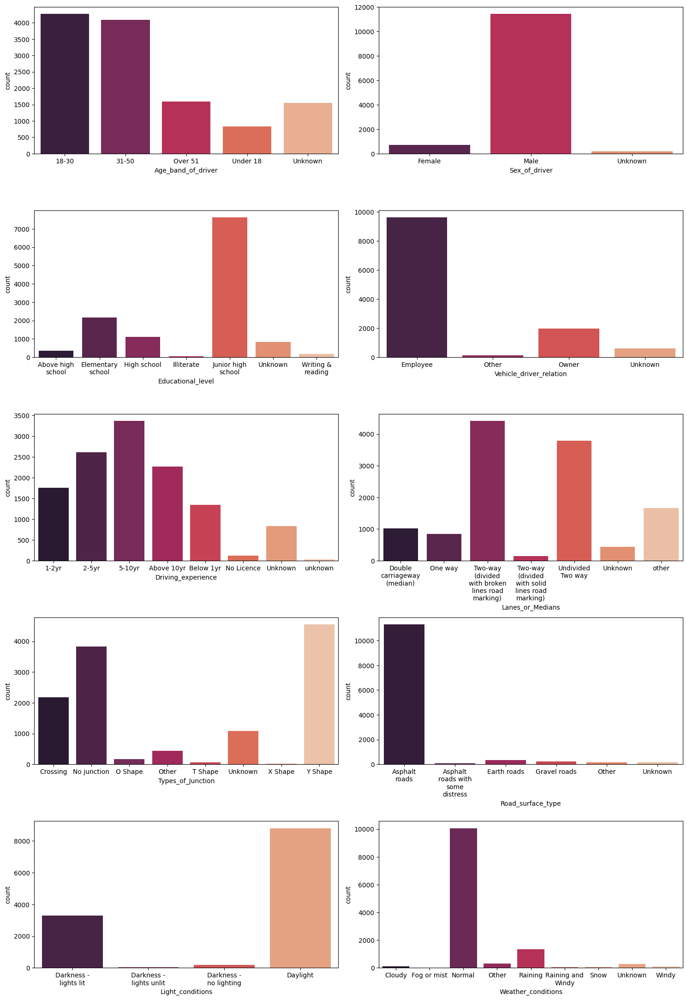

In [7]:
# Show countplots of categorical values
from matplotlib import pyplot as plt
import seaborn as sns
import textwrap

cols = list(df.columns[:-1])

plt.figure(figsize = (15, 30))
for i in range(len(cols[:10])):
    ax = plt.subplot(7, 2, i+1)
    sns.countplot(data=df, x=cols[i], palette='rocket')
    labels = [textwrap.fill(label.get_text(), 12) for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels);

plt.tight_layout()
plt.show()

We also inspect the distribution of accident severity.

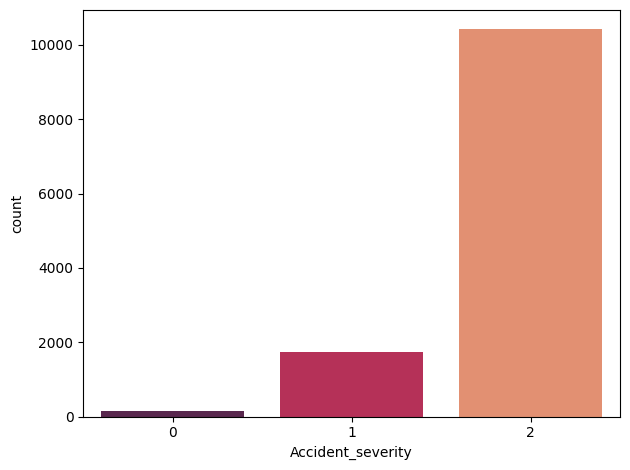

In [8]:
# Show distribution of accident severity
from math import sqrt, ceil

sns.countplot(data=df, x='Accident_severity', palette='rocket') 

plt.tight_layout()
plt.show()

In [9]:
# Show count of each value in accident severity
df['Accident_severity'].value_counts()

2    10415
1     1743
0      158
Name: Accident_severity, dtype: int64

From the information above, we observe that accident severity is heavily skewed towards class '2', with very few observations for class '0'. Thus, we are dealing with imbalanced classes in our dataset.

## One Hot Encoding & Training-Validation Split

We now split and rename the data in preparation for our model. For our model, we interpreted all of our features as nominal data.

In [10]:
# Create dataframe of features
x = df.iloc[:,:-1]

# Rename columns
columns = []
for i in range(len(x.columns)):
    columns.append("x{}".format(i))
x.columns = columns

# Convert features through one hot encoding
x = pd.get_dummies(x, columns=x.columns)
x

,x0_18-30,x0_31-50,x0_Over 51,x0_Under 18,x0_Unknown,x1_Female,x1_Male,x1_Unknown,x2_Above high school,x2_Elementary school,...,x13_No distancing,x13_No priority to pedestrian,x13_No priority to vehicle,x13_Other,x13_Overloading,x13_Overspeed,x13_Overtaking,x13_Overturning,x13_Turnover,x13_Unknown
0,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
12312,0,0,0,0,1,0,1,0,0,1,...,1,0,0,0,0,0,0,0,0,0
12313,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12314,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
# Convert labels into one hot encoding
y = pd.get_dummies(df['Accident_severity'], prefix='y')
y

,y_0,y_1,y_2
0,0,0,1
1,0,0,1
2,0,1,0
3,0,0,1
4,0,0,1
...,...,...,...
12311,0,0,1
12312,0,0,1
12313,0,1,0
12314,0,0,1


In [12]:
from sklearn.model_selection import train_test_split

# Split data into 70% training and 30% validation
x_train, x_test, y_train, y_test = train_test_split(x, y, 
                                                    train_size = 0.7,
                                                    random_state=1)

len_input = len(x_train.columns)
len_output = len(y_train.columns)

# Check shapes of x_train, x_test, y_train, y_test
print(f'Shape of x_train: {x_train.shape}')
print(f'Shape of x_test:  {x_test.shape}')
print(f'Shape of y_train: {y_train.shape}')
print(f'Shape of y_test:  {y_test.shape}')
print(f'Len Input: {len_input}')
print(f'Len Output: {len_output}')

Shape of x_train: (8621, 113)
Shape of x_test:  (3695, 113)
Shape of y_train: (8621, 3)
Shape of y_test:  (3695, 3)
Len Input: 113
Len Output: 3


In [13]:
x_validation = x_test.copy()
y_validation = y_test.copy()

# **Compute class weights to compensate for imbalanced classes**

Rather than generate data for classes 0 and 1 to balance out the bias towards class 2, we instead chose to compute class weights for our model.

In [14]:
from sklearn.utils import compute_class_weight
from sklearn.utils import class_weight
import numpy as np
import torch
import torch.nn as nn

In [15]:
# Series that represents the class of each one-hot encoded row in y
y_classes = y.idxmax(axis = 1)

# Compute weights
class_weights=class_weight.compute_class_weight(class_weight = "balanced", 
                                                classes = np.unique(y_classes), 
                                                y = y_classes)
class_weights=torch.tensor(class_weights, dtype=torch.float)

print(f'The computed weights for classes y=0, y=1, and y=2 respectively are: {class_weights}')

The computed weights for classes y=0, y=1, and y=2 respectively are: tensor([25.9831,  2.3553,  0.3942])


In [16]:
# Use weights in model's loss function
device = 'cpu'
criterion = nn.CrossEntropyLoss(weight=class_weights)
criterion = criterion.to(device)

# Feature Relevance

In [17]:
from sklearn.ensemble import RandomForestClassifier

In [18]:
# Train a random forest classifier on the training data
clf = RandomForestClassifier()
clf.fit(x_train, y_train)

# Get the feature importances
importances = clf.feature_importances_

# Sort the features by their importances
sortedIndices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

# Get the names of the features
featureNames = x_train.columns

for f in range(x_train.shape[1]):
    print("%d. feature %s (%f)" % (f + 1, featureNames[sortedIndices[f]], importances[sortedIndices[f]]))

Feature ranking:
1. feature x2_Junior high school (0.025021)
2. feature x5_Undivided Two way (0.024360)
3. feature x5_Two-way (divided with broken lines road marking) (0.024080)
4. feature x4_5-10yr (0.023998)
5. feature x11_Going straight (0.023947)
6. feature x0_18-30 (0.023712)
7. feature x6_Y Shape (0.023039)
8. feature x4_2-5yr (0.022978)
9. feature x10_Vehicle with vehicle collision (0.022922)
10. feature x0_31-50 (0.022680)
11. feature x4_Above 10yr (0.022060)
12. feature x13_No distancing (0.021979)
13. feature x13_Changing lane to the right (0.021394)
14. feature x8_Daylight (0.020041)
15. feature x13_Driving carelessly (0.019802)
16. feature x6_No junction (0.019680)
17. feature x8_Darkness - lights lit (0.019555)
18. feature x5_other (0.018763)
19. feature x13_Changing lane to the left (0.018676)
20. feature x2_Elementary school (0.018437)
21. feature x3_Employee (0.017430)
22. feature x10_Collision with roadside objects (0.016692)
23. feature x4_1-2yr (0.016525)
24. feature

In [19]:
# Select the top-ranked features
numFeatures = 86
topFeatures = sortedIndices[:numFeatures]

# Print the top-ranked features
print("Top %d features:" % numFeatures)
for f in topFeatures:
    print("%d. feature %s (%f)" % (f + 1, featureNames[f], importances[f]))

# Drop unimportant features
x_train = x_train.drop(featureNames[np.argsort(importances)][numFeatures:], axis=1)
x_test = x_test.drop(featureNames[np.argsort(importances)][numFeatures:], axis=1)

Top 86 features:
13. feature x2_Junior high school (0.025021)
32. feature x5_Undivided Two way (0.024360)
30. feature x5_Two-way (divided with broken lines road marking) (0.024080)
22. feature x4_5-10yr (0.023998)
74. feature x11_Going straight (0.023947)
1. feature x0_18-30 (0.023712)
42. feature x6_Y Shape (0.023039)
21. feature x4_2-5yr (0.022978)
70. feature x10_Vehicle with vehicle collision (0.022922)
2. feature x0_31-50 (0.022680)
23. feature x4_Above 10yr (0.022060)
104. feature x13_No distancing (0.021979)
95. feature x13_Changing lane to the right (0.021394)
52. feature x8_Daylight (0.020041)
97. feature x13_Driving carelessly (0.019802)
36. feature x6_No junction (0.019680)
49. feature x8_Darkness - lights lit (0.019555)
34. feature x5_other (0.018763)
94. feature x13_Changing lane to the left (0.018676)
10. feature x2_Elementary school (0.018437)
16. feature x3_Employee (0.017430)
64. feature x10_Collision with roadside objects (0.016692)
20. feature x4_1-2yr (0.016525)
103

In [20]:
x_train

,x0_Over 51,x0_Under 18,x0_Unknown,x1_Female,x1_Male,x1_Unknown,x2_Above high school,x2_High school,x2_Illiterate,x2_Unknown,...,x13_Getting off the vehicle improperly,x13_Improper parking,x13_No priority to pedestrian,x13_Other,x13_Overloading,x13_Overspeed,x13_Overtaking,x13_Overturning,x13_Turnover,x13_Unknown
10057,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5884,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12249,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5760,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7834,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10955,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5192,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12172,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# **Hyperparameter Optimization**

In [21]:
from hyperopt import hp, fmin, tpe
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPClassifier
from hyperopt.pyll.base import scope

In [22]:
import warnings
warnings.filterwarnings("ignore")

In [23]:
def f(params):
    model = MLPClassifier(
        random_state=1, 
        max_iter=1000,
        batch_size=params['batch_size'],
        learning_rate_init=params['learning_rate'],
        hidden_layer_sizes=(params['num_neurons_per_layer'],) * params['num_hidden_layers'],
        activation='relu',
    )
        
    model.fit(x_train.values, y_train.values)
    predictions = model.predict(x_test.values)
    score = mean_squared_error(predictions, y_test.values)
    
    return score

In [24]:
params_list = {
    'batch_size': scope.int(hp.uniform('batch_size', 2, 15)),
    'learning_rate': hp.uniform('learning_rate', 0.0005, 0.001),
    'num_hidden_layers': scope.int(hp.uniform('num_hidden_layers', 1, 5)),
    'num_neurons_per_layer': scope.int(hp.uniform('num_neurons_per_layer', 10, 100)),
}

best_params = fmin(fn=f, space=params_list, max_evals=24, algo=tpe.suggest)


print(best_params)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [17:21<00:00, 43.38s/trial, best loss: 0.11926026161479476]
{'batch_size': 6.231704095982286, 'learning_rate': 0.0006762532880329809, 'num_hidden_layers': 4.3134881072170845, 'num_neurons_per_layer': 17.27075075008191}


In [26]:
epochs = 100

# **Network Architecture**

In [27]:
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score
from tqdm import tqdm

In [28]:
class CustomDataset(Dataset):
    def __init__(self, x, y):
        self.x = x
        self.y = y
        self.n_samples = len(x)
    
    def __getitem__(self, index):
        return self.x[index], self.y[index]
    
    def __len__(self):
        return self.n_samples

In [29]:
def one_hot_encoding(nd_array):
    one_hot_encoding_predictions = nd_array

    for i in range(len(nd_array)):
        max_pred = max(nd_array[i])

        for j in range(len(nd_array[i])):
            one_hot_encoding_predictions[i][j] = 1 if nd_array[i][j] == max_pred else 0

    return one_hot_encoding_predictions

In [34]:
class MultiLayerPerceptron(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()

        # Summarize features per layer. Rounded down hidden layer size based on average best params. Used 54 neurons per layer from best params
        self.input_1 = nn.Linear(input_dim, 54)
        self.input_2 = nn.Linear(54, 54)
        self.input_3 = nn.Linear(54, 54)
        self.output = nn.Linear(54, output_dim)

    # Implement forward pass
    def forward(self, x):
        x = F.leaky_relu(self.input_1(x))
        x = F.leaky_relu(self.input_2(x))
        x = F.leaky_relu(self.input_3(x))
        x = torch.sigmoid(self.output(x))
        y = F.softmax(x, dim=-1)

        return y

In [35]:
def train_fn(loader, model, optimizer, loss_fn, device):
    loop = tqdm(loader)

    average_loss = 0
    count = 0
    
    for batch_idx, (data, targets) in enumerate(loop):
        data = data.to(device=device)
        targets = targets.to(device=device)
        
        # Forward
        predictions = model.forward(data)
        predictions = F.softmax(predictions, dim=-1)
        loss = loss_fn(predictions, targets)
        
        # Backward
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update tqdm
        loop.set_postfix(loss=loss.item())
        average_loss += loss.item()
        count += 1
    
    average_loss = average_loss / count

    return average_loss

# **Cross Validation**

In [36]:
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from torch.utils.data.sampler import SubsetRandomSampler

In [37]:
k = 5
folds = KFold(n_splits=k, random_state=1, shuffle=True)

losses = []
accuracies = []
fold_index = 0

for train_index, test_index in folds.split(x, y):

    current_fold_losses = []
    current_fold_accuracies = []
    
    # Get train and test sets by KFold classifications
    x_train = pd.DataFrame(x.iloc[train_index])
    x_test  = pd.DataFrame(x.iloc[test_index])
    
    y_train = pd.DataFrame(y.iloc[train_index])
    y_test  = pd.DataFrame(y.iloc[test_index])
    
    # Set up model with best hyperparameters
    model = MultiLayerPerceptron(len(x.columns), len(y.columns))
    optimizer = optim.Adam(model.parameters(), lr=best_params['learning_rate'])

    # Tensor device conversions
    x_train = torch.tensor(x_train.values).float().to(device)
    y_train = torch.tensor(y_train.values).float().to(device)

    x_test = torch.tensor(x_test.values).float().to(device)
    y_test = torch.tensor(y_test.values).float().to(device)

    # Load training data
    training_ds = CustomDataset(x_train, y_train)
    train_loader = DataLoader(
        training_ds,
        batch_size=int(best_params['batch_size']),
        shuffle=False,
        drop_last=False
    )
    
    y_test = y_test.detach().cpu().numpy()

    # Iterate over epochs per fold
    for epoch in range(epochs):
        print("Fold {}, Epoch {}:".format(fold_index, epoch))
        average_loss = train_fn(train_loader, model, optimizer, criterion, device)

        one_hot_encoding_predictions = one_hot_encoding(
            model.forward(x_test).detach().cpu().numpy()
        )

        acc_score = accuracy_score(
            y_test,
            one_hot_encoding_predictions
        )

        current_fold_losses.append(average_loss)
        current_fold_accuracies.append(acc_score)
        
        print("Average Loss: {}".format(average_loss))
        print("Acc Score: {}".format(acc_score))
        print("------------------")
        
        predictions = model.forward(x_test)
        one_hot_encoding_predictions = one_hot_encoding(predictions.detach().cpu().numpy())
    
    # Save losses and accuracies from current fold and proceed to next fold
    losses.append(current_fold_losses)
    accuracies.append(current_fold_accuracies)
    fold_index += 1

Fold 0, Epoch 0:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 736.09it/s, loss=0.791]


Average Loss: 1.10916369968297
Acc Score: 0.14082792207792208
------------------
Fold 0, Epoch 1:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 749.26it/s, loss=0.794]


Average Loss: 1.1064739674511257
Acc Score: 0.14082792207792208
------------------
Fold 0, Epoch 2:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 803.68it/s, loss=0.818]


Average Loss: 1.1026077632237585
Acc Score: 0.09131493506493507
------------------
Fold 0, Epoch 3:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 783.23it/s, loss=0.823]


Average Loss: 1.0973407431402393
Acc Score: 0.1331168831168831
------------------
Fold 0, Epoch 4:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 718.13it/s, loss=0.822]


Average Loss: 1.0944456563543314
Acc Score: 0.12378246753246754
------------------
Fold 0, Epoch 5:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 796.97it/s, loss=0.82]


Average Loss: 1.093036114733925
Acc Score: 0.1992694805194805
------------------
Fold 0, Epoch 6:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 799.59it/s, loss=0.774]


Average Loss: 1.0946114843350525
Acc Score: 0.17491883116883117
------------------
Fold 0, Epoch 7:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 760.91it/s, loss=0.775]


Average Loss: 1.0974426747058108
Acc Score: 0.18506493506493507
------------------
Fold 0, Epoch 8:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 711.71it/s, loss=0.774]


Average Loss: 1.0933392859369189
Acc Score: 0.28936688311688313
------------------
Fold 0, Epoch 9:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 702.50it/s, loss=0.775]


Average Loss: 1.0906708323273095
Acc Score: 0.16883116883116883
------------------
Fold 0, Epoch 10:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 746.68it/s, loss=0.811]


Average Loss: 1.0962072605047097
Acc Score: 0.2483766233766234
------------------
Fold 0, Epoch 11:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 667.68it/s, loss=0.817]


Average Loss: 1.091240579114907
Acc Score: 0.330762987012987
------------------
Fold 0, Epoch 12:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 744.43it/s, loss=0.811]


Average Loss: 1.0906612992504483
Acc Score: 0.3299512987012987
------------------
Fold 0, Epoch 13:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 712.67it/s, loss=0.781]


Average Loss: 1.0879975694722874
Acc Score: 0.3003246753246753
------------------
Fold 0, Epoch 14:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 715.72it/s, loss=0.766]


Average Loss: 1.0868038768708779
Acc Score: 0.3612012987012987
------------------
Fold 0, Epoch 15:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 683.47it/s, loss=0.766]


Average Loss: 1.0871776312262944
Acc Score: 0.3364448051948052
------------------
Fold 0, Epoch 16:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 763.21it/s, loss=0.766]


Average Loss: 1.0870551688735
Acc Score: 0.3522727272727273
------------------
Fold 0, Epoch 17:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 715.76it/s, loss=0.766]


Average Loss: 1.0856536329155573
Acc Score: 0.3534902597402597
------------------
Fold 0, Epoch 18:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 713.37it/s, loss=0.766]


Average Loss: 1.0863376328955323
Acc Score: 0.34983766233766234
------------------
Fold 0, Epoch 19:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 686.72it/s, loss=0.766]


Average Loss: 1.0872657191956667
Acc Score: 0.46185064935064934
------------------
Fold 0, Epoch 20:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 732.44it/s, loss=0.767]


Average Loss: 1.0872121813199989
Acc Score: 0.3534902597402597
------------------
Fold 0, Epoch 21:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 724.54it/s, loss=0.766]


Average Loss: 1.085954977374129
Acc Score: 0.4107142857142857
------------------
Fold 0, Epoch 22:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 626.78it/s, loss=0.765]


Average Loss: 1.085899964483153
Acc Score: 0.4577922077922078
------------------
Fold 0, Epoch 23:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 804.83it/s, loss=0.766]


Average Loss: 1.0869699696965978
Acc Score: 0.4054383116883117
------------------
Fold 0, Epoch 24:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 804.45it/s, loss=0.766]


Average Loss: 1.0864651945854076
Acc Score: 0.3961038961038961
------------------
Fold 0, Epoch 25:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 803.81it/s, loss=0.766]


Average Loss: 1.0868912413081067
Acc Score: 0.3340097402597403
------------------
Fold 0, Epoch 26:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 749.59it/s, loss=0.766]


Average Loss: 1.0868550783860407
Acc Score: 0.39042207792207795
------------------
Fold 0, Epoch 27:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 760.69it/s, loss=0.768]


Average Loss: 1.0874178669303112
Acc Score: 0.36079545454545453
------------------
Fold 0, Epoch 28:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 738.09it/s, loss=0.766]


Average Loss: 1.0853997191071656
Acc Score: 0.4354707792207792
------------------
Fold 0, Epoch 29:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 783.99it/s, loss=0.766]


Average Loss: 1.0876422982558553
Acc Score: 0.3835227272727273
------------------
Fold 0, Epoch 30:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 698.08it/s, loss=0.766]


Average Loss: 1.0846475745924498
Acc Score: 0.41233766233766234
------------------
Fold 0, Epoch 31:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 787.21it/s, loss=0.766]


Average Loss: 1.084684307987594
Acc Score: 0.4147727272727273
------------------
Fold 0, Epoch 32:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 645.99it/s, loss=0.769]


Average Loss: 1.084079593891929
Acc Score: 0.36810064935064934
------------------
Fold 0, Epoch 33:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 661.60it/s, loss=0.769]


Average Loss: 1.0828688429820552
Acc Score: 0.39569805194805197
------------------
Fold 0, Epoch 34:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 767.04it/s, loss=0.816]


Average Loss: 1.0835271239752602
Acc Score: 0.41883116883116883
------------------
Fold 0, Epoch 35:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 750.89it/s, loss=0.766]


Average Loss: 1.0841641182694743
Acc Score: 0.40016233766233766
------------------
Fold 0, Epoch 36:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 800.02it/s, loss=0.769]


Average Loss: 1.0832456374647557
Acc Score: 0.3758116883116883
------------------
Fold 0, Epoch 37:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 800.59it/s, loss=0.766]


Average Loss: 1.0838740572024785
Acc Score: 0.45332792207792205
------------------
Fold 0, Epoch 38:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 801.02it/s, loss=0.766]


Average Loss: 1.083812419701726
Acc Score: 0.4289772727272727
------------------
Fold 0, Epoch 39:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 801.66it/s, loss=0.764]


Average Loss: 1.0831731556031068
Acc Score: 0.4119318181818182
------------------
Fold 0, Epoch 40:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.75it/s, loss=0.766]


Average Loss: 1.0865417907284471
Acc Score: 0.39569805194805197
------------------
Fold 0, Epoch 41:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:03<00:00, 532.59it/s, loss=0.765]


Average Loss: 1.082196592195606
Acc Score: 0.45535714285714285
------------------
Fold 0, Epoch 42:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:03<00:00, 531.57it/s, loss=0.769]


Average Loss: 1.082625165509103
Acc Score: 0.3871753246753247
------------------
Fold 0, Epoch 43:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 673.27it/s, loss=0.766]


Average Loss: 1.0840538626538996
Acc Score: 0.4366883116883117
------------------
Fold 0, Epoch 44:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 745.44it/s, loss=0.766]


Average Loss: 1.0823148503699924
Acc Score: 0.45616883116883117
------------------
Fold 0, Epoch 45:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 620.51it/s, loss=0.766]


Average Loss: 1.0814725062044181
Acc Score: 0.49107142857142855
------------------
Fold 0, Epoch 46:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 774.56it/s, loss=0.766]


Average Loss: 1.0832366248032352
Acc Score: 0.40137987012987014
------------------
Fold 0, Epoch 47:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 644.35it/s, loss=0.765]


Average Loss: 1.0845311198397183
Acc Score: 0.5491071428571429
------------------
Fold 0, Epoch 48:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 695.00it/s, loss=0.765]


Average Loss: 1.0848613506620897
Acc Score: 0.48579545454545453
------------------
Fold 0, Epoch 49:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 665.55it/s, loss=0.766]


Average Loss: 1.083212503253615
Acc Score: 0.40137987012987014
------------------
Fold 0, Epoch 50:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 674.14it/s, loss=0.766]


Average Loss: 1.0838287809407667
Acc Score: 0.5064935064935064
------------------
Fold 0, Epoch 51:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 669.82it/s, loss=0.766]


Average Loss: 1.0842229411568625
Acc Score: 0.44805194805194803
------------------
Fold 0, Epoch 52:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 862.38it/s, loss=0.765]


Average Loss: 1.0812672648519894
Acc Score: 0.40787337662337664
------------------
Fold 0, Epoch 53:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 858.05it/s, loss=0.766]


Average Loss: 1.0823456517417307
Acc Score: 0.533685064935065
------------------
Fold 0, Epoch 54:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 860.37it/s, loss=0.766]


Average Loss: 1.0831178281542444
Acc Score: 0.43587662337662336
------------------
Fold 0, Epoch 55:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 857.55it/s, loss=0.763]


Average Loss: 1.083073056880362
Acc Score: 0.5791396103896104
------------------
Fold 0, Epoch 56:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 872.27it/s, loss=0.766]


Average Loss: 1.0824162401576571
Acc Score: 0.5198863636363636
------------------
Fold 0, Epoch 57:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 872.58it/s, loss=0.757]


Average Loss: 1.0832682755048615
Acc Score: 0.5109577922077922
------------------
Fold 0, Epoch 58:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 855.83it/s, loss=0.765]


Average Loss: 1.0795219012975112
Acc Score: 0.413961038961039
------------------
Fold 0, Epoch 59:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 871.34it/s, loss=0.764]


Average Loss: 1.081286192593708
Acc Score: 0.4512987012987013
------------------
Fold 0, Epoch 60:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 873.55it/s, loss=0.766]


Average Loss: 1.081207303396096
Acc Score: 0.5044642857142857
------------------
Fold 0, Epoch 61:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 850.14it/s, loss=0.766]


Average Loss: 1.0829956078137317
Acc Score: 0.5641233766233766
------------------
Fold 0, Epoch 62:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 736.12it/s, loss=0.766]


Average Loss: 1.0820948807533999
Acc Score: 0.44561688311688313
------------------
Fold 0, Epoch 63:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 785.53it/s, loss=0.766]


Average Loss: 1.0833839453602534
Acc Score: 0.4549512987012987
------------------
Fold 0, Epoch 64:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 874.25it/s, loss=0.753]


Average Loss: 1.0862328346442072
Acc Score: 0.5718344155844156
------------------
Fold 0, Epoch 65:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 872.19it/s, loss=0.766]


Average Loss: 1.0837014583954712
Acc Score: 0.45535714285714285
------------------
Fold 0, Epoch 66:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:01<00:00, 869.88it/s, loss=0.766]


Average Loss: 1.0823099448206073
Acc Score: 0.4273538961038961
------------------
Fold 0, Epoch 67:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 651.32it/s, loss=0.766]


Average Loss: 1.0823400223335018
Acc Score: 0.455762987012987
------------------
Fold 0, Epoch 68:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 717.37it/s, loss=0.761]


Average Loss: 1.0848498829571251
Acc Score: 0.5
------------------
Fold 0, Epoch 69:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 624.04it/s, loss=0.753]


Average Loss: 1.0829653343895902
Acc Score: 0.5426136363636364
------------------
Fold 0, Epoch 70:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 652.60it/s, loss=0.753]


Average Loss: 1.0842486040782406
Acc Score: 0.5020292207792207
------------------
Fold 0, Epoch 71:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 679.90it/s, loss=0.753]


Average Loss: 1.082808803317753
Acc Score: 0.5166396103896104
------------------
Fold 0, Epoch 72:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 799.11it/s, loss=0.757]


Average Loss: 1.0833659386409766
Acc Score: 0.512987012987013
------------------
Fold 0, Epoch 73:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 788.13it/s, loss=0.752]


Average Loss: 1.0909805829283963
Acc Score: 0.6314935064935064
------------------
Fold 0, Epoch 74:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 800.17it/s, loss=0.761]


Average Loss: 1.0865430000275555
Acc Score: 0.4679383116883117
------------------
Fold 0, Epoch 75:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 798.02it/s, loss=0.757]


Average Loss: 1.083841171973225
Acc Score: 0.5170454545454546
------------------
Fold 0, Epoch 76:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.49it/s, loss=0.757]


Average Loss: 1.0844666895237678
Acc Score: 0.5097402597402597
------------------
Fold 0, Epoch 77:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.51it/s, loss=0.761]


Average Loss: 1.0850568517552515
Acc Score: 0.5028409090909091
------------------
Fold 0, Epoch 78:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.07it/s, loss=0.757]


Average Loss: 1.0846401194924995
Acc Score: 0.5324675324675324
------------------
Fold 0, Epoch 79:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 804.89it/s, loss=0.757]


Average Loss: 1.0834735190897418
Acc Score: 0.5491071428571429
------------------
Fold 0, Epoch 80:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 803.98it/s, loss=0.757]


Average Loss: 1.0837203305073981
Acc Score: 0.5267857142857143
------------------
Fold 0, Epoch 81:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 785.18it/s, loss=0.757]


Average Loss: 1.0854920309658609
Acc Score: 0.47118506493506496
------------------
Fold 0, Epoch 82:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 805.49it/s, loss=0.742]


Average Loss: 1.0851831514928285
Acc Score: 0.5056818181818182
------------------
Fold 0, Epoch 83:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 805.77it/s, loss=0.74]


Average Loss: 1.0892652785552985
Acc Score: 0.6034902597402597
------------------
Fold 0, Epoch 84:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 807.04it/s, loss=0.74]


Average Loss: 1.0927213181930977
Acc Score: 0.640827922077922
------------------
Fold 0, Epoch 85:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 805.47it/s, loss=0.74]


Average Loss: 1.0909107100949071
Acc Score: 0.5974025974025974
------------------
Fold 0, Epoch 86:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 803.41it/s, loss=0.74]


Average Loss: 1.0904546604195697
Acc Score: 0.5698051948051948
------------------
Fold 0, Epoch 87:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 805.47it/s, loss=0.74]


Average Loss: 1.091254025262108
Acc Score: 0.5568181818181818
------------------
Fold 0, Epoch 88:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.23it/s, loss=0.744]


Average Loss: 1.094656817533357
Acc Score: 0.5762987012987013
------------------
Fold 0, Epoch 89:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.13it/s, loss=0.741]


Average Loss: 1.0913796925261599
Acc Score: 0.541801948051948
------------------
Fold 0, Epoch 90:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 804.29it/s, loss=0.748]


Average Loss: 1.0904337048131278
Acc Score: 0.525974025974026
------------------
Fold 0, Epoch 91:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.19it/s, loss=0.74]


Average Loss: 1.0906409125380336
Acc Score: 0.6002435064935064
------------------
Fold 0, Epoch 92:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 807.86it/s, loss=0.744]


Average Loss: 1.0918054243824225
Acc Score: 0.5487012987012987
------------------
Fold 0, Epoch 93:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 809.48it/s, loss=0.74]


Average Loss: 1.0953430044447752
Acc Score: 0.5998376623376623
------------------
Fold 0, Epoch 94:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 804.32it/s, loss=0.74]


Average Loss: 1.0982112860926467
Acc Score: 0.6034902597402597
------------------
Fold 0, Epoch 95:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 806.13it/s, loss=0.749]


Average Loss: 1.0912389024347975
Acc Score: 0.4979707792207792
------------------
Fold 0, Epoch 96:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 804.99it/s, loss=0.749]


Average Loss: 1.0880439273840616
Acc Score: 0.5401785714285714
------------------
Fold 0, Epoch 97:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 805.96it/s, loss=0.744]


Average Loss: 1.0910293143356036
Acc Score: 0.5401785714285714
------------------
Fold 0, Epoch 98:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 807.48it/s, loss=0.732]


Average Loss: 1.0933075604935365
Acc Score: 0.6416396103896104
------------------
Fold 0, Epoch 99:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1642/1642 [00:02<00:00, 804.59it/s, loss=0.749]


Average Loss: 1.0911429795038394
Acc Score: 0.4273538961038961
------------------
Fold 1, Epoch 0:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.51it/s, loss=0.433]


Average Loss: 1.0862222153895233
Acc Score: 0.14088509947218839
------------------
Fold 1, Epoch 1:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.87it/s, loss=0.435]


Average Loss: 1.0848248495028212
Acc Score: 0.14088509947218839
------------------
Fold 1, Epoch 2:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 805.35it/s, loss=0.442]


Average Loss: 1.0827874119007508
Acc Score: 0.056435241575314654
------------------
Fold 1, Epoch 3:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.19it/s, loss=0.45]


Average Loss: 1.07890791341218
Acc Score: 0.06577344701583435
------------------
Fold 1, Epoch 4:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.39it/s, loss=0.451]


Average Loss: 1.0773874526878573
Acc Score: 0.06983353633779943
------------------
Fold 1, Epoch 5:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.97it/s, loss=0.451]


Average Loss: 1.0753036958556021
Acc Score: 0.07023954526999594
------------------
Fold 1, Epoch 6:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.55it/s, loss=0.451]


Average Loss: 1.0769437728897508
Acc Score: 0.0832318311002842
------------------
Fold 1, Epoch 7:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.47it/s, loss=0.451]


Average Loss: 1.0794274950636935
Acc Score: 0.10393828664230613
------------------
Fold 1, Epoch 8:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.33it/s, loss=0.451]


Average Loss: 1.0773051191014773
Acc Score: 0.08932196508323183
------------------
Fold 1, Epoch 9:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.73it/s, loss=0.401]


Average Loss: 1.0809520568088722
Acc Score: 0.6276898091758019
------------------
Fold 1, Epoch 10:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.58it/s, loss=0.451]


Average Loss: 1.0766029667723709
Acc Score: 0.4336175395858709
------------------
Fold 1, Epoch 11:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.67it/s, loss=0.451]


Average Loss: 1.0759616036351252
Acc Score: 0.09744214372716199
------------------
Fold 1, Epoch 12:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.13it/s, loss=0.451]


Average Loss: 1.0793254949737452
Acc Score: 0.11327649208282582
------------------
Fold 1, Epoch 13:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.27it/s, loss=0.451]


Average Loss: 1.0773712294862101
Acc Score: 0.13601299228583028
------------------
Fold 1, Epoch 14:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.85it/s, loss=0.45]


Average Loss: 1.0770073938464073
Acc Score: 0.1311408850994722
------------------
Fold 1, Epoch 15:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 792.40it/s, loss=0.451]


Average Loss: 1.0770966903835408
Acc Score: 0.23995127892813642
------------------
Fold 1, Epoch 16:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.87it/s, loss=0.451]


Average Loss: 1.075928209670346
Acc Score: 0.25091352009744217
------------------
Fold 1, Epoch 17:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.16it/s, loss=0.451]


Average Loss: 1.0742464851694578
Acc Score: 0.35282176207876575
------------------
Fold 1, Epoch 18:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.79it/s, loss=0.451]


Average Loss: 1.0758332958217083
Acc Score: 0.17823792123426715
------------------
Fold 1, Epoch 19:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.07it/s, loss=0.451]


Average Loss: 1.0758164905043397
Acc Score: 0.2911084043848965
------------------
Fold 1, Epoch 20:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.11it/s, loss=0.451]


Average Loss: 1.0724091506084146
Acc Score: 0.27161997563946405
------------------
Fold 1, Epoch 21:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.94it/s, loss=0.45]


Average Loss: 1.076513666081414
Acc Score: 0.47949654892407634
------------------
Fold 1, Epoch 22:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.07it/s, loss=0.451]


Average Loss: 1.0762834172203857
Acc Score: 0.2492894843686561
------------------
Fold 1, Epoch 23:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 735.68it/s, loss=0.451]


Average Loss: 1.0766209209211992
Acc Score: 0.35322777101096225
------------------
Fold 1, Epoch 24:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 744.79it/s, loss=0.451]


Average Loss: 1.0742014999333054
Acc Score: 0.42184328055217213
------------------
Fold 1, Epoch 25:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.24it/s, loss=0.451]


Average Loss: 1.0719224833818157
Acc Score: 0.32886723507917176
------------------
Fold 1, Epoch 26:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.88it/s, loss=0.451]


Average Loss: 1.0712221138954743
Acc Score: 0.31993503857084854
------------------
Fold 1, Epoch 27:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 789.80it/s, loss=0.451]


Average Loss: 1.0715831077033546
Acc Score: 0.45026390580592773
------------------
Fold 1, Epoch 28:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 775.62it/s, loss=0.451]


Average Loss: 1.0722597190249785
Acc Score: 0.38976857490864797
------------------
Fold 1, Epoch 29:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 723.79it/s, loss=0.451]


Average Loss: 1.071719917450021
Acc Score: 0.3926106374340235
------------------
Fold 1, Epoch 30:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 736.38it/s, loss=0.451]


Average Loss: 1.070850617390033
Acc Score: 0.3804303694681283
------------------
Fold 1, Epoch 31:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.23it/s, loss=0.451]


Average Loss: 1.070727282700855
Acc Score: 0.45676004872107184
------------------
Fold 1, Epoch 32:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 810.55it/s, loss=0.451]


Average Loss: 1.069384665857055
Acc Score: 0.3848964677222899
------------------
Fold 1, Epoch 33:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.83it/s, loss=0.451]


Average Loss: 1.0696329919216623
Acc Score: 0.3609419407226959
------------------
Fold 1, Epoch 34:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.11it/s, loss=0.451]


Average Loss: 1.0696327362710647
Acc Score: 0.37880633373934225
------------------
Fold 1, Epoch 35:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.88it/s, loss=0.451]


Average Loss: 1.0703499336940663
Acc Score: 0.4185952090946001
------------------
Fold 1, Epoch 36:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 810.20it/s, loss=0.451]


Average Loss: 1.069105979315914
Acc Score: 0.4291514413317093
------------------
Fold 1, Epoch 37:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 810.29it/s, loss=0.451]


Average Loss: 1.0704426209301174
Acc Score: 0.38976857490864797
------------------
Fold 1, Epoch 38:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.04it/s, loss=0.451]


Average Loss: 1.0697556677491507
Acc Score: 0.36662606577344703
------------------
Fold 1, Epoch 39:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 810.64it/s, loss=0.45]


Average Loss: 1.078058520886351
Acc Score: 0.2139667072675599
------------------
Fold 1, Epoch 40:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.45it/s, loss=0.451]


Average Loss: 1.074179074384059
Acc Score: 0.3865205034510759
------------------
Fold 1, Epoch 41:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.53it/s, loss=0.451]


Average Loss: 1.0691824310339593
Acc Score: 0.49533089727974017
------------------
Fold 1, Epoch 42:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.06it/s, loss=0.451]


Average Loss: 1.0708363185150915
Acc Score: 0.4047909053999188
------------------
Fold 1, Epoch 43:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.76it/s, loss=0.451]


Average Loss: 1.0748582841852272
Acc Score: 0.36703207470564353
------------------
Fold 1, Epoch 44:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.03it/s, loss=0.451]


Average Loss: 1.0728334892978773
Acc Score: 0.4056029232643118
------------------
Fold 1, Epoch 45:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.87it/s, loss=0.422]


Average Loss: 1.0741231924357098
Acc Score: 0.5042630937880633
------------------
Fold 1, Epoch 46:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.63it/s, loss=0.422]


Average Loss: 1.0772627912965114
Acc Score: 0.5326837190418189
------------------
Fold 1, Epoch 47:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.81it/s, loss=0.451]


Average Loss: 1.0738789045404387
Acc Score: 0.35972391392610636
------------------
Fold 1, Epoch 48:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.23it/s, loss=0.4]


Average Loss: 1.0727670471877204
Acc Score: 0.5042630937880633
------------------
Fold 1, Epoch 49:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.12it/s, loss=0.451]


Average Loss: 1.0715235361077766
Acc Score: 0.40276086073893624
------------------
Fold 1, Epoch 50:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 812.05it/s, loss=0.451]


Average Loss: 1.0720639947123884
Acc Score: 0.45554202192448234
------------------
Fold 1, Epoch 51:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.51it/s, loss=0.451]


Average Loss: 1.0694460591127868
Acc Score: 0.43118148599269185
------------------
Fold 1, Epoch 52:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.85it/s, loss=0.451]


Average Loss: 1.0691359820376063
Acc Score: 0.46163215590742995
------------------
Fold 1, Epoch 53:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.82it/s, loss=0.451]


Average Loss: 1.0696138433762896
Acc Score: 0.4457978075517661
------------------
Fold 1, Epoch 54:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 805.15it/s, loss=0.451]


Average Loss: 1.0692812225039383
Acc Score: 0.4397076735688185
------------------
Fold 1, Epoch 55:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.14it/s, loss=0.413]


Average Loss: 1.069661875795607
Acc Score: 0.4405196914332115
------------------
Fold 1, Epoch 56:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.74it/s, loss=0.433]


Average Loss: 1.0704658779696001
Acc Score: 0.4340235485180674
------------------
Fold 1, Epoch 57:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.97it/s, loss=0.4]


Average Loss: 1.069432358460969
Acc Score: 0.4190012180267966
------------------
Fold 1, Epoch 58:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 810.15it/s, loss=0.4]


Average Loss: 1.0692137854714547
Acc Score: 0.4279334145351198
------------------
Fold 1, Epoch 59:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.43it/s, loss=0.4]


Average Loss: 1.0709025859832764
Acc Score: 0.44295574502639057
------------------
Fold 1, Epoch 60:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.64it/s, loss=0.4]


Average Loss: 1.0681623646528056
Acc Score: 0.4575720665854649
------------------
Fold 1, Epoch 61:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.47it/s, loss=0.4]


Average Loss: 1.0717888395197133
Acc Score: 0.5261875761266748
------------------
Fold 1, Epoch 62:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.05it/s, loss=0.4]


Average Loss: 1.068754827094673
Acc Score: 0.47503045066991473
------------------
Fold 1, Epoch 63:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.62it/s, loss=0.4]


Average Loss: 1.0702292403286722
Acc Score: 0.3629719853836784
------------------
Fold 1, Epoch 64:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 810.11it/s, loss=0.4]


Average Loss: 1.071209707350101
Acc Score: 0.34916768168899714
------------------
Fold 1, Epoch 65:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.53it/s, loss=0.4]


Average Loss: 1.0687692106967284
Acc Score: 0.3816483962647178
------------------
Fold 1, Epoch 66:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.08it/s, loss=0.4]


Average Loss: 1.0682481296419444
Acc Score: 0.44133170929760457
------------------
Fold 1, Epoch 67:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.42it/s, loss=0.4]


Average Loss: 1.0694917036822418
Acc Score: 0.43808363784003246
------------------
Fold 1, Epoch 68:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.97it/s, loss=0.4]


Average Loss: 1.0686488418555884
Acc Score: 0.41291108404384896
------------------
Fold 1, Epoch 69:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.39it/s, loss=0.4]


Average Loss: 1.0666581731305498
Acc Score: 0.41209906617945596
------------------
Fold 1, Epoch 70:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.79it/s, loss=0.4]


Average Loss: 1.0677156045860585
Acc Score: 0.46203816483962645
------------------
Fold 1, Epoch 71:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.84it/s, loss=0.4]


Average Loss: 1.0671190036482296
Acc Score: 0.47503045066991473
------------------
Fold 1, Epoch 72:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.60it/s, loss=0.4]


Average Loss: 1.0692113726442352
Acc Score: 0.43645960211124646
------------------
Fold 1, Epoch 73:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 754.67it/s, loss=0.4]


Average Loss: 1.0671143232143585
Acc Score: 0.46000812017864395
------------------
Fold 1, Epoch 74:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 700.66it/s, loss=0.4]


Average Loss: 1.0691322596676816
Acc Score: 0.4705643524157532
------------------
Fold 1, Epoch 75:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 745.27it/s, loss=0.4]


Average Loss: 1.0685653486813413
Acc Score: 0.4173771822980106
------------------
Fold 1, Epoch 76:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 686.94it/s, loss=0.4]


Average Loss: 1.0669792316269018
Acc Score: 0.464880227365002
------------------
Fold 1, Epoch 77:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 736.39it/s, loss=0.4]


Average Loss: 1.0672013846135908
Acc Score: 0.46650426309378806
------------------
Fold 1, Epoch 78:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 789.27it/s, loss=0.4]


Average Loss: 1.0696931401549936
Acc Score: 0.4705643524157532
------------------
Fold 1, Epoch 79:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.18it/s, loss=0.4]


Average Loss: 1.0715305255776995
Acc Score: 0.4462038164839626
------------------
Fold 1, Epoch 80:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 631.40it/s, loss=0.4]


Average Loss: 1.07346548648847
Acc Score: 0.4522939504669103
------------------
Fold 1, Epoch 81:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 758.25it/s, loss=0.433]


Average Loss: 1.071568149186748
Acc Score: 0.41981323589118963
------------------
Fold 1, Epoch 82:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 743.84it/s, loss=0.4]


Average Loss: 1.0676086189466791
Acc Score: 0.536743808363784
------------------
Fold 1, Epoch 83:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:01<00:00, 828.30it/s, loss=0.433]


Average Loss: 1.0683110771169042
Acc Score: 0.46122614697523345
------------------
Fold 1, Epoch 84:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 756.53it/s, loss=0.433]


Average Loss: 1.067393826027143
Acc Score: 0.4518879415347138
------------------
Fold 1, Epoch 85:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 738.99it/s, loss=0.412]


Average Loss: 1.067500735936336
Acc Score: 0.464880227365002
------------------
Fold 1, Epoch 86:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:01<00:00, 850.93it/s, loss=0.4]


Average Loss: 1.0665174687481913
Acc Score: 0.5562322371092164
------------------
Fold 1, Epoch 87:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:01<00:00, 865.26it/s, loss=0.4]


Average Loss: 1.0681309498306897
Acc Score: 0.5749086479902558
------------------
Fold 1, Epoch 88:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:01<00:00, 846.50it/s, loss=0.4]


Average Loss: 1.0669504800767196
Acc Score: 0.37921234267153875
------------------
Fold 1, Epoch 89:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:01<00:00, 864.19it/s, loss=0.4]


Average Loss: 1.0693243782439033
Acc Score: 0.5071051563134389
------------------
Fold 1, Epoch 90:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:01<00:00, 867.14it/s, loss=0.4]


Average Loss: 1.0659109277109946
Acc Score: 0.5241575314656922
------------------
Fold 1, Epoch 91:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 719.41it/s, loss=0.4]


Average Loss: 1.0680057307749498
Acc Score: 0.47909053999187984
------------------
Fold 1, Epoch 92:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 555.21it/s, loss=0.4]


Average Loss: 1.0663674692337062
Acc Score: 0.4693463256191636
------------------
Fold 1, Epoch 93:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 700.04it/s, loss=0.4]


Average Loss: 1.0670146349901408
Acc Score: 0.4981729598051157
------------------
Fold 1, Epoch 94:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 695.17it/s, loss=0.428]


Average Loss: 1.066126164763132
Acc Score: 0.4405196914332115
------------------
Fold 1, Epoch 95:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 715.88it/s, loss=0.4]


Average Loss: 1.0661772318315883
Acc Score: 0.4681282988225741
------------------
Fold 1, Epoch 96:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 673.93it/s, loss=0.4]


Average Loss: 1.0644895752174275
Acc Score: 0.5188794153471377
------------------
Fold 1, Epoch 97:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 647.71it/s, loss=0.4]


Average Loss: 1.0659120220167202
Acc Score: 0.5269995939910678
------------------
Fold 1, Epoch 98:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 710.36it/s, loss=0.4]


Average Loss: 1.0653762682066121
Acc Score: 0.49127080795777506
------------------
Fold 1, Epoch 99:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 722.68it/s, loss=0.4]


Average Loss: 1.0691202708808518
Acc Score: 0.5002030044660982
------------------
Fold 2, Epoch 0:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 791.38it/s, loss=0.435]


Average Loss: 1.0913005272426477
Acc Score: 0.14697523345513602
------------------
Fold 2, Epoch 1:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 794.88it/s, loss=0.437]


Average Loss: 1.08974268459287
Acc Score: 0.11611855460820138
------------------
Fold 2, Epoch 2:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 787.21it/s, loss=0.45]


Average Loss: 1.086014094308463
Acc Score: 0.0682095006090134
------------------
Fold 2, Epoch 3:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 788.00it/s, loss=0.45]


Average Loss: 1.0829429702467115
Acc Score: 0.10921640276086074
------------------
Fold 2, Epoch 4:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.77it/s, loss=0.45]


Average Loss: 1.0813416963623417
Acc Score: 0.07998375964271214
------------------
Fold 2, Epoch 5:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 792.13it/s, loss=0.449]


Average Loss: 1.0805431882455736
Acc Score: 0.09541209906617945
------------------
Fold 2, Epoch 6:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.69it/s, loss=0.441]


Average Loss: 1.0793338620619155
Acc Score: 0.09460008120178644
------------------
Fold 2, Epoch 7:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.22it/s, loss=0.45]


Average Loss: 1.0783778210456822
Acc Score: 0.08729192042224929
------------------
Fold 2, Epoch 8:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.94it/s, loss=0.451]


Average Loss: 1.0772906348100175
Acc Score: 0.08363784003248072
------------------
Fold 2, Epoch 9:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.84it/s, loss=0.451]


Average Loss: 1.0780426284850406
Acc Score: 0.09297604547300041
------------------
Fold 2, Epoch 10:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.95it/s, loss=0.451]


Average Loss: 1.0788805125982965
Acc Score: 0.21274868047097037
------------------
Fold 2, Epoch 11:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 794.88it/s, loss=0.456]


Average Loss: 1.0755564507666115
Acc Score: 0.10353227771010962
------------------
Fold 2, Epoch 12:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.97it/s, loss=0.451]


Average Loss: 1.0732211776426923
Acc Score: 0.12423873325213154
------------------
Fold 2, Epoch 13:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.94it/s, loss=0.451]


Average Loss: 1.071778349537568
Acc Score: 0.16524563540397888
------------------
Fold 2, Epoch 14:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.74it/s, loss=0.45]


Average Loss: 1.0714850522582298
Acc Score: 0.17661388550548113
------------------
Fold 2, Epoch 15:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.21it/s, loss=0.45]


Average Loss: 1.0718348778135807
Acc Score: 0.19366626065773446
------------------
Fold 2, Epoch 16:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 793.66it/s, loss=0.451]


Average Loss: 1.0718618184600164
Acc Score: 0.2046285018270402
------------------
Fold 2, Epoch 17:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 794.19it/s, loss=0.451]


Average Loss: 1.0704751877398733
Acc Score: 0.2570036540803898
------------------
Fold 2, Epoch 18:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 665.21it/s, loss=0.451]


Average Loss: 1.0703696558842628
Acc Score: 0.23020706455542023
------------------
Fold 2, Epoch 19:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.35it/s, loss=0.449]


Average Loss: 1.0747282264694091
Acc Score: 0.25213154689403167
------------------
Fold 2, Epoch 20:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 728.57it/s, loss=0.451]


Average Loss: 1.0723313694854952
Acc Score: 0.25213154689403167
------------------
Fold 2, Epoch 21:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 609.73it/s, loss=0.451]


Average Loss: 1.0716571049652517
Acc Score: 0.2233049127080796
------------------
Fold 2, Epoch 22:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 646.88it/s, loss=0.401]


Average Loss: 1.0714455152421338
Acc Score: 0.38246041412911086
------------------
Fold 2, Epoch 23:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 748.27it/s, loss=0.451]


Average Loss: 1.0703519457226762
Acc Score: 0.3313032886723508
------------------
Fold 2, Epoch 24:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 626.72it/s, loss=0.447]


Average Loss: 1.0695241756977574
Acc Score: 0.3499796995533902
------------------
Fold 2, Epoch 25:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 649.08it/s, loss=0.451]


Average Loss: 1.0678883263851475
Acc Score: 0.32399512789281365
------------------
Fold 2, Epoch 26:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 712.10it/s, loss=0.43]


Average Loss: 1.0688798102168724
Acc Score: 0.4043848964677223
------------------
Fold 2, Epoch 27:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.06it/s, loss=0.435]


Average Loss: 1.0696257495582648
Acc Score: 0.3406414941128705
------------------
Fold 2, Epoch 28:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.08it/s, loss=0.421]


Average Loss: 1.0675382106063283
Acc Score: 0.32358911896061715
------------------
Fold 2, Epoch 29:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.07it/s, loss=0.402]


Average Loss: 1.0660469190093416
Acc Score: 0.33089727974015426
------------------
Fold 2, Epoch 30:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.84it/s, loss=0.422]


Average Loss: 1.0661439934265882
Acc Score: 0.26958993097848155
------------------
Fold 2, Epoch 31:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 796.96it/s, loss=0.45]


Average Loss: 1.0653976645327456
Acc Score: 0.2789281364190012
------------------
Fold 2, Epoch 32:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.97it/s, loss=0.449]


Average Loss: 1.0653183580134167
Acc Score: 0.29922858302882666
------------------
Fold 2, Epoch 33:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.29it/s, loss=0.4]


Average Loss: 1.0638148241556786
Acc Score: 0.3325213154689403
------------------
Fold 2, Epoch 34:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.81it/s, loss=0.425]


Average Loss: 1.0637878450546334
Acc Score: 0.3122208688591149
------------------
Fold 2, Epoch 35:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.21it/s, loss=0.4]


Average Loss: 1.0630653926097107
Acc Score: 0.31465692245229393
------------------
Fold 2, Epoch 36:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.13it/s, loss=0.402]


Average Loss: 1.0635239934674574
Acc Score: 0.3471376370280146
------------------
Fold 2, Epoch 37:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.34it/s, loss=0.4]


Average Loss: 1.0625813861337292
Acc Score: 0.39545269995939913
------------------
Fold 2, Epoch 38:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.36it/s, loss=0.419]


Average Loss: 1.061815197084709
Acc Score: 0.3024766544863987
------------------
Fold 2, Epoch 39:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.41it/s, loss=0.4]


Average Loss: 1.0609910844559358
Acc Score: 0.3524157531465692
------------------
Fold 2, Epoch 40:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.87it/s, loss=0.4]


Average Loss: 1.0617822021409207
Acc Score: 0.31628095818108
------------------
Fold 2, Epoch 41:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.70it/s, loss=0.4]


Average Loss: 1.0621745355667607
Acc Score: 0.488834754364596
------------------
Fold 2, Epoch 42:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.94it/s, loss=0.4]


Average Loss: 1.0619695455615867
Acc Score: 0.3808363784003248
------------------
Fold 2, Epoch 43:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.11it/s, loss=0.4]


Average Loss: 1.0603573881157708
Acc Score: 0.38286642306130736
------------------
Fold 2, Epoch 44:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.22it/s, loss=0.4]


Average Loss: 1.0591103009203913
Acc Score: 0.3552578156719448
------------------
Fold 2, Epoch 45:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 805.07it/s, loss=0.4]


Average Loss: 1.0595534028654336
Acc Score: 0.3853024766544864
------------------
Fold 2, Epoch 46:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 807.59it/s, loss=0.4]


Average Loss: 1.059729675784462
Acc Score: 0.43727161997563946
------------------
Fold 2, Epoch 47:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 805.52it/s, loss=0.4]


Average Loss: 1.0597463206445308
Acc Score: 0.4279334145351198
------------------
Fold 2, Epoch 48:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.86it/s, loss=0.4]


Average Loss: 1.0593545624234657
Acc Score: 0.4815265935850589
------------------
Fold 2, Epoch 49:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 809.36it/s, loss=0.4]


Average Loss: 1.0601465962351058
Acc Score: 0.414535119772635
------------------
Fold 2, Epoch 50:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 808.57it/s, loss=0.4]


Average Loss: 1.05906916838264
Acc Score: 0.49127080795777506
------------------
Fold 2, Epoch 51:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 724.86it/s, loss=0.4]


Average Loss: 1.0574939932064247
Acc Score: 0.37352821762078764
------------------
Fold 2, Epoch 52:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 778.98it/s, loss=0.4]


Average Loss: 1.058295671216468
Acc Score: 0.4234673162809582
------------------
Fold 2, Epoch 53:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 657.47it/s, loss=0.4]


Average Loss: 1.058063719342267
Acc Score: 0.4332115306536744
------------------
Fold 2, Epoch 54:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 695.51it/s, loss=0.4]


Average Loss: 1.0590740244924042
Acc Score: 0.5408038976857491
------------------
Fold 2, Epoch 55:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 681.91it/s, loss=0.4]


Average Loss: 1.0588293837579517
Acc Score: 0.5054811205846529
------------------
Fold 2, Epoch 56:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 719.49it/s, loss=0.4]


Average Loss: 1.0581915402151214
Acc Score: 0.42752740560292324
------------------
Fold 2, Epoch 57:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.65it/s, loss=0.4]


Average Loss: 1.0573492667621327
Acc Score: 0.44295574502639057
------------------
Fold 2, Epoch 58:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 768.63it/s, loss=0.4]


Average Loss: 1.05757176386316
Acc Score: 0.4035728786033293
------------------
Fold 2, Epoch 59:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.16it/s, loss=0.4]


Average Loss: 1.0579045691906643
Acc Score: 0.3848964677222899
------------------
Fold 2, Epoch 60:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 697.12it/s, loss=0.4]


Average Loss: 1.058517396304931
Acc Score: 0.4149411287048315
------------------
Fold 2, Epoch 61:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 699.09it/s, loss=0.4]


Average Loss: 1.0571487740416825
Acc Score: 0.39748274462038163
------------------
Fold 2, Epoch 62:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 705.97it/s, loss=0.4]


Average Loss: 1.0576033389974642
Acc Score: 0.4522939504669103
------------------
Fold 2, Epoch 63:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 727.24it/s, loss=0.4]


Average Loss: 1.0578463533196012
Acc Score: 0.47990255785627284
------------------
Fold 2, Epoch 64:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 719.34it/s, loss=0.4]


Average Loss: 1.0551161451341173
Acc Score: 0.4876167275680065
------------------
Fold 2, Epoch 65:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 625.79it/s, loss=0.4]


Average Loss: 1.0563646371743336
Acc Score: 0.4681282988225741
------------------
Fold 2, Epoch 66:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 642.14it/s, loss=0.4]


Average Loss: 1.056862902873475
Acc Score: 0.42143727161997563
------------------
Fold 2, Epoch 67:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 706.79it/s, loss=0.4]


Average Loss: 1.0556143227504364
Acc Score: 0.4457978075517661
------------------
Fold 2, Epoch 68:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 756.95it/s, loss=0.4]


Average Loss: 1.0555055237766888
Acc Score: 0.4628501827040195
------------------
Fold 2, Epoch 69:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 678.39it/s, loss=0.4]


Average Loss: 1.055603605740983
Acc Score: 0.40316686967113274
------------------
Fold 2, Epoch 70:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 654.52it/s, loss=0.4]


Average Loss: 1.0560350530552414
Acc Score: 0.42671538773853024
------------------
Fold 2, Epoch 71:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 662.31it/s, loss=0.4]


Average Loss: 1.055613543083228
Acc Score: 0.5038570848558668
------------------
Fold 2, Epoch 72:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 676.82it/s, loss=0.4]


Average Loss: 1.0548031967693323
Acc Score: 0.4336175395858709
------------------
Fold 2, Epoch 73:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 774.80it/s, loss=0.4]


Average Loss: 1.0551829727698736
Acc Score: 0.4234673162809582
------------------
Fold 2, Epoch 74:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 794.56it/s, loss=0.4]


Average Loss: 1.0554650813903448
Acc Score: 0.4238733252131547
------------------
Fold 2, Epoch 75:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 743.89it/s, loss=0.4]


Average Loss: 1.0561003063919336
Acc Score: 0.48599269183922045
------------------
Fold 2, Epoch 76:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 761.15it/s, loss=0.4]


Average Loss: 1.0559646475989863
Acc Score: 0.4835566382460414
------------------
Fold 2, Epoch 77:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 796.77it/s, loss=0.401]


Average Loss: 1.056094765626869
Acc Score: 0.4299634591961023
------------------
Fold 2, Epoch 78:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.59it/s, loss=0.4]


Average Loss: 1.0551544576611231
Acc Score: 0.5123832724319936
------------------
Fold 2, Epoch 79:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.27it/s, loss=0.4]


Average Loss: 1.0557768489265327
Acc Score: 0.48030856678846934
------------------
Fold 2, Epoch 80:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.71it/s, loss=0.4]


Average Loss: 1.0548826845876342
Acc Score: 0.4993909866017052
------------------
Fold 2, Epoch 81:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.43it/s, loss=0.402]


Average Loss: 1.0552954825046073
Acc Score: 0.46731628095818106
------------------
Fold 2, Epoch 82:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 795.15it/s, loss=0.4]


Average Loss: 1.0537145706987643
Acc Score: 0.534307754770605
------------------
Fold 2, Epoch 83:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.32it/s, loss=0.4]


Average Loss: 1.0542012153604883
Acc Score: 0.4778725131952903
------------------
Fold 2, Epoch 84:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.76it/s, loss=0.4]


Average Loss: 1.0547675277972033
Acc Score: 0.4279334145351198
------------------
Fold 2, Epoch 85:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.50it/s, loss=0.4]


Average Loss: 1.0552315403612662
Acc Score: 0.5018270401948843
------------------
Fold 2, Epoch 86:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.86it/s, loss=0.4]


Average Loss: 1.054496867095851
Acc Score: 0.46203816483962645
------------------
Fold 2, Epoch 87:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.71it/s, loss=0.4]


Average Loss: 1.0542916788499093
Acc Score: 0.5550142103126269
------------------
Fold 2, Epoch 88:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.96it/s, loss=0.4]


Average Loss: 1.0548871451409503
Acc Score: 0.5152253349573691
------------------
Fold 2, Epoch 89:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.74it/s, loss=0.4]


Average Loss: 1.0544193736932224
Acc Score: 0.5237515225334958
------------------
Fold 2, Epoch 90:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.65it/s, loss=0.4]


Average Loss: 1.0540068073927158
Acc Score: 0.5058871295168493
------------------
Fold 2, Epoch 91:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.94it/s, loss=0.4]


Average Loss: 1.0536893491003474
Acc Score: 0.5265935850588713
------------------
Fold 2, Epoch 92:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 805.42it/s, loss=0.4]


Average Loss: 1.0537233165466995
Acc Score: 0.5075111652456354
------------------
Fold 2, Epoch 93:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.81it/s, loss=0.402]


Average Loss: 1.0527518504796345
Acc Score: 0.4831506293138449
------------------
Fold 2, Epoch 94:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.52it/s, loss=0.4]


Average Loss: 1.0523591335960372
Acc Score: 0.5302476654486399
------------------
Fold 2, Epoch 95:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 805.83it/s, loss=0.4]


Average Loss: 1.0542350229662654
Acc Score: 0.5339017458384084
------------------
Fold 2, Epoch 96:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.46it/s, loss=0.41]


Average Loss: 1.0528408247598844
Acc Score: 0.5164433617539586
------------------
Fold 2, Epoch 97:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.23it/s, loss=0.4]


Average Loss: 1.0538871488190975
Acc Score: 0.5253755582622818
------------------
Fold 2, Epoch 98:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.64it/s, loss=0.4]


Average Loss: 1.0534215810563023
Acc Score: 0.5018270401948843
------------------
Fold 2, Epoch 99:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.86it/s, loss=0.4]


Average Loss: 1.0525210759513492
Acc Score: 0.5387738530247665
------------------
Fold 3, Epoch 0:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.95it/s, loss=2.58]


Average Loss: 1.1077391808887698
Acc Score: 0.15265935850588713
------------------
Fold 3, Epoch 1:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.66it/s, loss=2.57]


Average Loss: 1.1044903892935303
Acc Score: 0.13235891189606172
------------------
Fold 3, Epoch 2:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.37it/s, loss=2.69]


Average Loss: 1.0978754269445516
Acc Score: 0.3227771010962241
------------------
Fold 3, Epoch 3:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.30it/s, loss=2.69]


Average Loss: 1.0959645840574603
Acc Score: 0.439301664636622
------------------
Fold 3, Epoch 4:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 794.84it/s, loss=2.69]


Average Loss: 1.095454608367408
Acc Score: 0.0921640276086074
------------------
Fold 3, Epoch 5:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.49it/s, loss=2.69]


Average Loss: 1.0941723556287828
Acc Score: 0.08363784003248072
------------------
Fold 3, Epoch 6:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.14it/s, loss=2.69]


Average Loss: 1.0940000726657166
Acc Score: 0.32846122614697526
------------------
Fold 3, Epoch 7:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.66it/s, loss=2.69]


Average Loss: 1.0920151989233617
Acc Score: 0.09500609013398295
------------------
Fold 3, Epoch 8:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.00it/s, loss=2.69]


Average Loss: 1.0914274944413094
Acc Score: 0.07389362565976451
------------------
Fold 3, Epoch 9:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.99it/s, loss=2.69]


Average Loss: 1.0936839956919449
Acc Score: 0.22695899309784814
------------------
Fold 3, Epoch 10:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.64it/s, loss=2.69]


Average Loss: 1.0948915569904152
Acc Score: 0.3995127892813642
------------------
Fold 3, Epoch 11:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.22it/s, loss=2.69]


Average Loss: 1.0916719033597666
Acc Score: 0.4035728786033293
------------------
Fold 3, Epoch 12:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.55it/s, loss=2.69]


Average Loss: 1.0909287994109633
Acc Score: 0.291514413317093
------------------
Fold 3, Epoch 13:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.95it/s, loss=2.69]


Average Loss: 1.0943831481443116
Acc Score: 0.2626877791311409
------------------
Fold 3, Epoch 14:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.57it/s, loss=2.69]


Average Loss: 1.09377094802157
Acc Score: 0.047503045066991476
------------------
Fold 3, Epoch 15:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.64it/s, loss=2.69]


Average Loss: 1.09288154158807
Acc Score: 0.09866017052375152
------------------
Fold 3, Epoch 16:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.71it/s, loss=2.69]


Average Loss: 1.0953522710740675
Acc Score: 0.10109622411693057
------------------
Fold 3, Epoch 17:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.15it/s, loss=2.69]


Average Loss: 1.0926403609884996
Acc Score: 0.07998375964271214
------------------
Fold 3, Epoch 18:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.75it/s, loss=2.69]


Average Loss: 1.094523117934794
Acc Score: 0.0925700365408039
------------------
Fold 3, Epoch 19:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.64it/s, loss=2.69]


Average Loss: 1.0956842404672886
Acc Score: 0.08932196508323183
------------------
Fold 3, Epoch 20:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 805.76it/s, loss=2.69]


Average Loss: 1.0926430519042187
Acc Score: 0.07105156313438896
------------------
Fold 3, Epoch 21:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.09it/s, loss=2.65]


Average Loss: 1.0963683262585289
Acc Score: 0.11693057247259439
------------------
Fold 3, Epoch 22:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.55it/s, loss=2.69]


Average Loss: 1.0931281861885973
Acc Score: 0.02639058059277304
------------------
Fold 3, Epoch 23:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.86it/s, loss=2.69]


Average Loss: 1.0930839281436227
Acc Score: 0.07429963459196103
------------------
Fold 3, Epoch 24:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.86it/s, loss=2.69]


Average Loss: 1.0939229011209144
Acc Score: 0.12139667072675599
------------------
Fold 3, Epoch 25:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.70it/s, loss=2.69]


Average Loss: 1.0947017074719625
Acc Score: 0.19488428745432398
------------------
Fold 3, Epoch 26:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.08it/s, loss=2.69]


Average Loss: 1.0948885335692964
Acc Score: 0.12058465286236297
------------------
Fold 3, Epoch 27:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.98it/s, loss=2.69]


Average Loss: 1.0947748343899566
Acc Score: 0.04709703613479497
------------------
Fold 3, Epoch 28:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.76it/s, loss=2.69]


Average Loss: 1.0952842347301222
Acc Score: 0.13763702801461633
------------------
Fold 3, Epoch 29:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.55it/s, loss=2.69]


Average Loss: 1.095452941668447
Acc Score: 0.21031262687779131
------------------
Fold 3, Epoch 30:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.86it/s, loss=2.69]


Average Loss: 1.0975926237104872
Acc Score: 0.06090133982947625
------------------
Fold 3, Epoch 31:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.91it/s, loss=2.69]


Average Loss: 1.0979513130533354
Acc Score: 0.7365002030044661
------------------
Fold 3, Epoch 32:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.67it/s, loss=2.69]


Average Loss: 1.0988726206872061
Acc Score: 0.5452699959399107
------------------
Fold 3, Epoch 33:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.05it/s, loss=2.69]


Average Loss: 1.0976825140266975
Acc Score: 0.6617945594803085
------------------
Fold 3, Epoch 34:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.24it/s, loss=2.69]


Average Loss: 1.0961130386035904
Acc Score: 0.587088915956151
------------------
Fold 3, Epoch 35:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.17it/s, loss=2.69]


Average Loss: 1.0965189287666859
Acc Score: 0.5927730410069022
------------------
Fold 3, Epoch 36:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.32it/s, loss=2.69]


Average Loss: 1.0971537322186873
Acc Score: 0.634185952090946
------------------
Fold 3, Epoch 37:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.78it/s, loss=2.69]


Average Loss: 1.095150198195667
Acc Score: 0.6719447827852213
------------------
Fold 3, Epoch 38:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.89it/s, loss=2.69]


Average Loss: 1.0957636183997297
Acc Score: 0.6199756394640682
------------------
Fold 3, Epoch 39:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.37it/s, loss=2.59]


Average Loss: 1.0970623998002025
Acc Score: 0.7555826228177019
------------------
Fold 3, Epoch 40:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.53it/s, loss=2.61]


Average Loss: 1.1000333760688745
Acc Score: 0.7320341047503045
------------------
Fold 3, Epoch 41:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.25it/s, loss=2.69]


Average Loss: 1.0990532671650661
Acc Score: 0.7373122208688592
------------------
Fold 3, Epoch 42:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.84it/s, loss=2.69]


Average Loss: 1.0997485325638288
Acc Score: 0.731628095818108
------------------
Fold 3, Epoch 43:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.63it/s, loss=2.59]


Average Loss: 1.0985020792165037
Acc Score: 0.756394640682095
------------------
Fold 3, Epoch 44:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.64it/s, loss=2.69]


Average Loss: 1.0984025512319182
Acc Score: 0.6151035322777101
------------------
Fold 3, Epoch 45:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.76it/s, loss=2.69]


Average Loss: 1.1004192124796002
Acc Score: 0.39707673568818513
------------------
Fold 3, Epoch 46:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.18it/s, loss=2.69]


Average Loss: 1.1008215881816077
Acc Score: 0.0020300446609825416
------------------
Fold 3, Epoch 47:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.22it/s, loss=2.69]


Average Loss: 1.1014610829145823
Acc Score: 0.0779537149817296
------------------
Fold 3, Epoch 48:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.21it/s, loss=2.69]


Average Loss: 1.0976501397439349
Acc Score: 0.010556232237109216
------------------
Fold 3, Epoch 49:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.05it/s, loss=2.69]


Average Loss: 1.097125833562722
Acc Score: 0.006496142915144133
------------------
Fold 3, Epoch 50:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.21it/s, loss=2.4]


Average Loss: 1.0992155395951564
Acc Score: 0.004466098254161592
------------------
Fold 3, Epoch 51:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.69it/s, loss=2.69]


Average Loss: 1.0985850443835674
Acc Score: 0.0637434023548518
------------------
Fold 3, Epoch 52:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.96it/s, loss=2.69]


Average Loss: 1.0992066640898865
Acc Score: 0.023548518067397484
------------------
Fold 3, Epoch 53:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.76it/s, loss=2.69]


Average Loss: 1.09538449157467
Acc Score: 0.015428339423467316
------------------
Fold 3, Epoch 54:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.65it/s, loss=2.69]


Average Loss: 1.097272169404979
Acc Score: 0.010150223304912708
------------------
Fold 3, Epoch 55:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.59it/s, loss=2.69]


Average Loss: 1.096672296542187
Acc Score: 0.005684125050751117
------------------
Fold 3, Epoch 56:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.33it/s, loss=2.69]


Average Loss: 1.0962909228251754
Acc Score: 0.01908241981323589
------------------
Fold 3, Epoch 57:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.07it/s, loss=2.52]


Average Loss: 1.0984471941857679
Acc Score: 0.09581810799837596
------------------
Fold 3, Epoch 58:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.18it/s, loss=2.52]


Average Loss: 1.1027016790081507
Acc Score: 0.01705237515225335
------------------
Fold 3, Epoch 59:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.09it/s, loss=2.52]


Average Loss: 1.1011775866450149
Acc Score: 0.004060089321965083
------------------
Fold 3, Epoch 60:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.02it/s, loss=2.52]


Average Loss: 1.1012282459494984
Acc Score: 0.006902151847340642
------------------
Fold 3, Epoch 61:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.18it/s, loss=2.52]


Average Loss: 1.1010439371961105
Acc Score: 0.005684125050751117
------------------
Fold 3, Epoch 62:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.44it/s, loss=2.52]


Average Loss: 1.0999733016974158
Acc Score: 0.013398294762484775
------------------
Fold 3, Epoch 63:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.24it/s, loss=2.52]


Average Loss: 1.1031955712391557
Acc Score: 0.0020300446609825416
------------------
Fold 3, Epoch 64:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.54it/s, loss=2.39]


Average Loss: 1.105343873643759
Acc Score: 0.0060901339829476245
------------------
Fold 3, Epoch 65:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 759.93it/s, loss=2.52]


Average Loss: 1.1040496084832303
Acc Score: 0.12261469752334551
------------------
Fold 3, Epoch 66:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 783.79it/s, loss=2.39]


Average Loss: 1.1044993179822504
Acc Score: 0.0048721071863581
------------------
Fold 3, Epoch 67:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.16it/s, loss=2.52]


Average Loss: 1.101555533512148
Acc Score: 0.006902151847340642
------------------
Fold 3, Epoch 68:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.62it/s, loss=2.52]


Average Loss: 1.100909039187707
Acc Score: 0.004060089321965083
------------------
Fold 3, Epoch 69:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.94it/s, loss=2.52]


Average Loss: 1.1008723422621927
Acc Score: 0.007714169711733658
------------------
Fold 3, Epoch 70:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.09it/s, loss=2.52]


Average Loss: 1.1014974584720225
Acc Score: 0.006902151847340642
------------------
Fold 3, Epoch 71:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.77it/s, loss=2.52]


Average Loss: 1.0999360753680176
Acc Score: 0.022330491270807957
------------------
Fold 3, Epoch 72:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.30it/s, loss=2.52]


Average Loss: 1.101352023592245
Acc Score: 0.02639058059277304
------------------
Fold 3, Epoch 73:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.53it/s, loss=2.52]


Average Loss: 1.1008500329111672
Acc Score: 0.010962241169305725
------------------
Fold 3, Epoch 74:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.09it/s, loss=2.52]


Average Loss: 1.1003207967764563
Acc Score: 0.012586276898091758
------------------
Fold 3, Epoch 75:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.23it/s, loss=2.52]


Average Loss: 1.1003075150622148
Acc Score: 0.0008120178643930166
------------------
Fold 3, Epoch 76:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.12it/s, loss=2.52]


Average Loss: 1.1000490647333103
Acc Score: 0.0016240357287860333
------------------
Fold 3, Epoch 77:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.87it/s, loss=2.52]


Average Loss: 1.1056846200839383
Acc Score: 0.0016240357287860333
------------------
Fold 3, Epoch 78:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.15it/s, loss=2.52]


Average Loss: 1.1029604256370775
Acc Score: 0.0028420625253755584
------------------
Fold 3, Epoch 79:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 806.34it/s, loss=2.52]


Average Loss: 1.1004378251454776
Acc Score: 0.0020300446609825416
------------------
Fold 3, Epoch 80:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.87it/s, loss=2.52]


Average Loss: 1.1017968106291602
Acc Score: 0.0016240357287860333
------------------
Fold 3, Epoch 81:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.13it/s, loss=2.52]


Average Loss: 1.1066622934324017
Acc Score: 0.0016240357287860333
------------------
Fold 3, Epoch 82:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 804.22it/s, loss=2.52]


Average Loss: 1.1054382759916732
Acc Score: 0.001218026796589525
------------------
Fold 3, Epoch 83:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.73it/s, loss=2.52]


Average Loss: 1.1021598017368097
Acc Score: 0.0036540803897685747
------------------
Fold 3, Epoch 84:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.77it/s, loss=2.52]


Average Loss: 1.1017553863986846
Acc Score: 0.005278116118554608
------------------
Fold 3, Epoch 85:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.56it/s, loss=2.52]


Average Loss: 1.1024040320590003
Acc Score: 0.001218026796589525
------------------
Fold 3, Epoch 86:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 794.76it/s, loss=2.52]


Average Loss: 1.108033568356288
Acc Score: 0.001218026796589525
------------------
Fold 3, Epoch 87:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 795.08it/s, loss=2.39]


Average Loss: 1.1032898051486244
Acc Score: 0.0194884287454324
------------------
Fold 3, Epoch 88:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.07it/s, loss=2.39]


Average Loss: 1.1048370478397016
Acc Score: 0.12139667072675599
------------------
Fold 3, Epoch 89:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.93it/s, loss=2.52]


Average Loss: 1.104803837060348
Acc Score: 0.11530653674380836
------------------
Fold 3, Epoch 90:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.41it/s, loss=2.52]


Average Loss: 1.1043599989272006
Acc Score: 0.1023142509135201
------------------
Fold 3, Epoch 91:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.15it/s, loss=2.52]


Average Loss: 1.1031587245946095
Acc Score: 0.11896061713357693
------------------
Fold 3, Epoch 92:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 796.51it/s, loss=2.52]


Average Loss: 1.104335491568739
Acc Score: 0.001218026796589525
------------------
Fold 3, Epoch 93:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.49it/s, loss=2.52]


Average Loss: 1.109134728978918
Acc Score: 0.001218026796589525
------------------
Fold 3, Epoch 94:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.31it/s, loss=2.52]


Average Loss: 1.1091527851594343
Acc Score: 0.0
------------------
Fold 3, Epoch 95:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 795.92it/s, loss=2.52]


Average Loss: 1.1091348818904079
Acc Score: 0.0
------------------
Fold 3, Epoch 96:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.64it/s, loss=2.52]


Average Loss: 1.1091348818904079
Acc Score: 0.0
------------------
Fold 3, Epoch 97:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.52it/s, loss=2.52]


Average Loss: 1.1091348818904079
Acc Score: 0.0
------------------
Fold 3, Epoch 98:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.56it/s, loss=2.52]


Average Loss: 1.1091348818904079
Acc Score: 0.0
------------------
Fold 3, Epoch 99:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 789.78it/s, loss=2.52]


Average Loss: 1.1091348818904079
Acc Score: 0.0
------------------
Fold 4, Epoch 0:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 775.79it/s, loss=0.433]


Average Loss: 1.0962351897251874
Acc Score: 0.5261875761266748
------------------
Fold 4, Epoch 1:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.92it/s, loss=0.434]


Average Loss: 1.0947675186181605
Acc Score: 0.0637434023548518
------------------
Fold 4, Epoch 2:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 793.87it/s, loss=0.449]


Average Loss: 1.092068241452271
Acc Score: 0.0637434023548518
------------------
Fold 4, Epoch 3:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.49it/s, loss=0.451]


Average Loss: 1.0855839158874856
Acc Score: 0.08201380430369468
------------------
Fold 4, Epoch 4:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.42it/s, loss=0.451]


Average Loss: 1.0806459169415388
Acc Score: 0.11896061713357693
------------------
Fold 4, Epoch 5:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.01it/s, loss=0.451]


Average Loss: 1.0814166627166768
Acc Score: 0.195696305318717
------------------
Fold 4, Epoch 6:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.66it/s, loss=0.451]


Average Loss: 1.0817607186657585
Acc Score: 0.17864393016646365
------------------
Fold 4, Epoch 7:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.57it/s, loss=0.45]


Average Loss: 1.079926910664494
Acc Score: 0.22777101096224117
------------------
Fold 4, Epoch 8:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.16it/s, loss=0.451]


Average Loss: 1.0813577800934735
Acc Score: 0.1660576532683719
------------------
Fold 4, Epoch 9:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.46it/s, loss=0.451]


Average Loss: 1.0788703828741701
Acc Score: 0.15306536743808363
------------------
Fold 4, Epoch 10:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.71it/s, loss=0.451]


Average Loss: 1.078557823771612
Acc Score: 0.14941128704831505
------------------
Fold 4, Epoch 11:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 796.79it/s, loss=0.451]


Average Loss: 1.0791427168589283
Acc Score: 0.22168087697929353
------------------
Fold 4, Epoch 12:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.78it/s, loss=0.45]


Average Loss: 1.0776381101901402
Acc Score: 0.2233049127080796
------------------
Fold 4, Epoch 13:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.56it/s, loss=0.451]


Average Loss: 1.0763424108540656
Acc Score: 0.2842062525375558
------------------
Fold 4, Epoch 14:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.60it/s, loss=0.451]


Average Loss: 1.077240460069892
Acc Score: 0.269183922046285
------------------
Fold 4, Epoch 15:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.89it/s, loss=0.451]


Average Loss: 1.0767092804537266
Acc Score: 0.24685343077547706
------------------
Fold 4, Epoch 16:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.08it/s, loss=0.451]


Average Loss: 1.0760946605746802
Acc Score: 0.28989037758830694
------------------
Fold 4, Epoch 17:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.29it/s, loss=0.451]


Average Loss: 1.076322728043566
Acc Score: 0.20178643930166465
------------------
Fold 4, Epoch 18:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.67it/s, loss=0.454]


Average Loss: 1.0764813746755906
Acc Score: 0.14941128704831505
------------------
Fold 4, Epoch 19:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.50it/s, loss=0.451]


Average Loss: 1.08062747353036
Acc Score: 0.21843280552172148
------------------
Fold 4, Epoch 20:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.91it/s, loss=0.451]


Average Loss: 1.0789628610586293
Acc Score: 0.219650832318311
------------------
Fold 4, Epoch 21:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.17it/s, loss=0.451]


Average Loss: 1.078525202563095
Acc Score: 0.2829882257409663
------------------
Fold 4, Epoch 22:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.45it/s, loss=0.451]


Average Loss: 1.0783716882610206
Acc Score: 0.20584652862362973
------------------
Fold 4, Epoch 23:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.53it/s, loss=0.451]


Average Loss: 1.0775278748641708
Acc Score: 0.2549736094194072
------------------
Fold 4, Epoch 24:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.42it/s, loss=0.451]


Average Loss: 1.0782413937772692
Acc Score: 0.2728380024360536
------------------
Fold 4, Epoch 25:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.18it/s, loss=0.449]


Average Loss: 1.0762097877623173
Acc Score: 0.3743402354851807
------------------
Fold 4, Epoch 26:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.79it/s, loss=0.451]


Average Loss: 1.0784016739320843
Acc Score: 0.24157531465692245
------------------
Fold 4, Epoch 27:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 793.95it/s, loss=0.422]


Average Loss: 1.0787182809990206
Acc Score: 0.3377994315874949
------------------
Fold 4, Epoch 28:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.93it/s, loss=0.422]


Average Loss: 1.0750982154453228
Acc Score: 0.29435647584246855
------------------
Fold 4, Epoch 29:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.96it/s, loss=0.422]


Average Loss: 1.074771854094594
Acc Score: 0.2829882257409663
------------------
Fold 4, Epoch 30:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.25it/s, loss=0.426]


Average Loss: 1.0757238454958034
Acc Score: 0.30572472594397077
------------------
Fold 4, Epoch 31:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.76it/s, loss=0.451]


Average Loss: 1.0777903054446907
Acc Score: 0.26431181485992694
------------------
Fold 4, Epoch 32:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.04it/s, loss=0.451]


Average Loss: 1.079212403177707
Acc Score: 0.20625253755582623
------------------
Fold 4, Epoch 33:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.64it/s, loss=0.451]


Average Loss: 1.0811820277809299
Acc Score: 0.2793341453511977
------------------
Fold 4, Epoch 34:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.27it/s, loss=0.422]


Average Loss: 1.0796701796194148
Acc Score: 0.40113682501015024
------------------
Fold 4, Epoch 35:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.43it/s, loss=0.422]


Average Loss: 1.0777098717699671
Acc Score: 0.40316686967113274
------------------
Fold 4, Epoch 36:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.00it/s, loss=0.45]


Average Loss: 1.0770214317378952
Acc Score: 0.3982947624847747
------------------
Fold 4, Epoch 37:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 795.60it/s, loss=0.451]


Average Loss: 1.0787421918212823
Acc Score: 0.3467316280958181
------------------
Fold 4, Epoch 38:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.54it/s, loss=0.451]


Average Loss: 1.0763512678757283
Acc Score: 0.36784409257003653
------------------
Fold 4, Epoch 39:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.39it/s, loss=0.422]


Average Loss: 1.073684660421953
Acc Score: 0.4108810393828664
------------------
Fold 4, Epoch 40:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.06it/s, loss=0.451]


Average Loss: 1.0753866625463389
Acc Score: 0.32318311002842065
------------------
Fold 4, Epoch 41:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 794.32it/s, loss=0.451]


Average Loss: 1.0771273669678485
Acc Score: 0.33008526187576126
------------------
Fold 4, Epoch 42:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.27it/s, loss=0.4]


Average Loss: 1.0758128135906655
Acc Score: 0.4583840844498579
------------------
Fold 4, Epoch 43:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.38it/s, loss=0.451]


Average Loss: 1.0784795375147465
Acc Score: 0.3926106374340235
------------------
Fold 4, Epoch 44:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.23it/s, loss=0.421]


Average Loss: 1.0802480393223697
Acc Score: 0.42590336987413724
------------------
Fold 4, Epoch 45:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.64it/s, loss=0.451]


Average Loss: 1.0752132146988276
Acc Score: 0.3024766544863987
------------------
Fold 4, Epoch 46:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.85it/s, loss=0.422]


Average Loss: 1.0799470567623435
Acc Score: 0.4579780755176614
------------------
Fold 4, Epoch 47:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.09it/s, loss=0.422]


Average Loss: 1.076281836082931
Acc Score: 0.40803897685749085
------------------
Fold 4, Epoch 48:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.64it/s, loss=0.451]


Average Loss: 1.074820069626781
Acc Score: 0.3572878603329273
------------------
Fold 4, Epoch 49:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.30it/s, loss=0.451]


Average Loss: 1.073161599662198
Acc Score: 0.31465692245229393
------------------
Fold 4, Epoch 50:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.03it/s, loss=0.451]


Average Loss: 1.0811520496375373
Acc Score: 0.5042630937880633
------------------
Fold 4, Epoch 51:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.13it/s, loss=0.451]


Average Loss: 1.0749423205852509
Acc Score: 0.42752740560292324
------------------
Fold 4, Epoch 52:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.44it/s, loss=0.451]


Average Loss: 1.0761842847378313
Acc Score: 0.3710921640276086
------------------
Fold 4, Epoch 53:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 780.28it/s, loss=0.451]


Average Loss: 1.0731924817247211
Acc Score: 0.38367844092570036
------------------
Fold 4, Epoch 54:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 803.31it/s, loss=0.451]


Average Loss: 1.0723483043876423
Acc Score: 0.40194884287454324
------------------
Fold 4, Epoch 55:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.92it/s, loss=0.451]


Average Loss: 1.0743709379808248
Acc Score: 0.3373934226552984
------------------
Fold 4, Epoch 56:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.44it/s, loss=0.451]


Average Loss: 1.073701006642073
Acc Score: 0.40276086073893624
------------------
Fold 4, Epoch 57:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.91it/s, loss=0.451]


Average Loss: 1.0724877655252187
Acc Score: 0.37271619975639464
------------------
Fold 4, Epoch 58:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.71it/s, loss=0.451]


Average Loss: 1.070759314556203
Acc Score: 0.42143727161997563
------------------
Fold 4, Epoch 59:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.84it/s, loss=0.451]


Average Loss: 1.0721301888265917
Acc Score: 0.3698741372310191
------------------
Fold 4, Epoch 60:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.54it/s, loss=0.449]


Average Loss: 1.0718281995720496
Acc Score: 0.41169305724725946
------------------
Fold 4, Epoch 61:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.00it/s, loss=0.419]


Average Loss: 1.071352801740859
Acc Score: 0.46691027202598456
------------------
Fold 4, Epoch 62:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 793.55it/s, loss=0.451]


Average Loss: 1.072752125656467
Acc Score: 0.36622005684125053
------------------
Fold 4, Epoch 63:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.49it/s, loss=0.449]


Average Loss: 1.071006452790572
Acc Score: 0.4474218432805522
------------------
Fold 4, Epoch 64:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.95it/s, loss=0.451]


Average Loss: 1.07045687291583
Acc Score: 0.38976857490864797
------------------
Fold 4, Epoch 65:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 795.81it/s, loss=0.451]


Average Loss: 1.0702928673437435
Acc Score: 0.365814047909054
------------------
Fold 4, Epoch 66:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.89it/s, loss=0.422]


Average Loss: 1.0719505321014529
Acc Score: 0.42143727161997563
------------------
Fold 4, Epoch 67:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.99it/s, loss=0.4]


Average Loss: 1.0717772961714902
Acc Score: 0.46122614697523345
------------------
Fold 4, Epoch 68:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.23it/s, loss=0.4]


Average Loss: 1.0725592615868504
Acc Score: 0.4336175395858709
------------------
Fold 4, Epoch 69:


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.58it/s, loss=0.45]


Average Loss: 1.0724797465238205
Acc Score: 0.37758830694275275
------------------
Fold 4, Epoch 70:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.30it/s, loss=0.422]


Average Loss: 1.0702934932106527
Acc Score: 0.37921234267153875
------------------
Fold 4, Epoch 71:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.22it/s, loss=0.4]


Average Loss: 1.0705975894875739
Acc Score: 0.3857084855866829
------------------
Fold 4, Epoch 72:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.43it/s, loss=0.4]


Average Loss: 1.069335885695111
Acc Score: 0.4449857896873731
------------------
Fold 4, Epoch 73:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.85it/s, loss=0.422]


Average Loss: 1.068673136915583
Acc Score: 0.40194884287454324
------------------
Fold 4, Epoch 74:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.87it/s, loss=0.451]


Average Loss: 1.0684940474866298
Acc Score: 0.27202598457166055
------------------
Fold 4, Epoch 75:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.08it/s, loss=0.4]


Average Loss: 1.071647322493505
Acc Score: 0.3942346731628096
------------------
Fold 4, Epoch 76:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.46it/s, loss=0.4]


Average Loss: 1.0686666922313879
Acc Score: 0.44133170929760457
------------------
Fold 4, Epoch 77:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.41it/s, loss=0.422]


Average Loss: 1.0680203384476614
Acc Score: 0.43808363784003246
------------------
Fold 4, Epoch 78:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.02it/s, loss=0.4]


Average Loss: 1.0688770958837472
Acc Score: 0.44173771822980107
------------------
Fold 4, Epoch 79:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.34it/s, loss=0.4]


Average Loss: 1.0691148227696294
Acc Score: 0.4169711733658141
------------------
Fold 4, Epoch 80:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.12it/s, loss=0.4]


Average Loss: 1.0697134387471368
Acc Score: 0.49614291514413317
------------------
Fold 4, Epoch 81:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.90it/s, loss=0.4]


Average Loss: 1.0687397086105184
Acc Score: 0.49533089727974017
------------------
Fold 4, Epoch 82:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.04it/s, loss=0.4]


Average Loss: 1.0691385877908763
Acc Score: 0.4721883881445392
------------------
Fold 4, Epoch 83:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.17it/s, loss=0.4]


Average Loss: 1.0687479851671058
Acc Score: 0.5164433617539586
------------------
Fold 4, Epoch 84:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.36it/s, loss=0.4]


Average Loss: 1.0671187341576005
Acc Score: 0.5505481120584653
------------------
Fold 4, Epoch 85:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.03it/s, loss=0.4]


Average Loss: 1.0673411404549604
Acc Score: 0.5022330491270808
------------------
Fold 4, Epoch 86:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.08it/s, loss=0.4]


Average Loss: 1.0669535352047521
Acc Score: 0.4730004060089322
------------------
Fold 4, Epoch 87:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 798.61it/s, loss=0.4]


Average Loss: 1.0666963281024904
Acc Score: 0.4705643524157532
------------------
Fold 4, Epoch 88:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.49it/s, loss=0.4]


Average Loss: 1.0654536024216683
Acc Score: 0.4721883881445392
------------------
Fold 4, Epoch 89:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.45it/s, loss=0.4]


Average Loss: 1.0660543741065414
Acc Score: 0.4685343077547706
------------------
Fold 4, Epoch 90:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 802.41it/s, loss=0.4]


Average Loss: 1.0675821361096256
Acc Score: 0.4835566382460414
------------------
Fold 4, Epoch 91:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.24it/s, loss=0.4]


Average Loss: 1.065455230448352
Acc Score: 0.5115712545676004
------------------
Fold 4, Epoch 92:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.51it/s, loss=0.4]


Average Loss: 1.0668670496270196
Acc Score: 0.5221274868047097
------------------
Fold 4, Epoch 93:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.65it/s, loss=0.4]


Average Loss: 1.0659457213691437
Acc Score: 0.5347137637028014
------------------
Fold 4, Epoch 94:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 796.55it/s, loss=0.4]


Average Loss: 1.0658499615916521
Acc Score: 0.5749086479902558
------------------
Fold 4, Epoch 95:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 800.26it/s, loss=0.4]


Average Loss: 1.0663598210109275
Acc Score: 0.5152253349573691
------------------
Fold 4, Epoch 96:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 797.89it/s, loss=0.4]


Average Loss: 1.0667420976675652
Acc Score: 0.5022330491270808
------------------
Fold 4, Epoch 97:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.40it/s, loss=0.4]


Average Loss: 1.0663944275656345
Acc Score: 0.5249695493300852
------------------
Fold 4, Epoch 98:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 801.07it/s, loss=0.4]


Average Loss: 1.067783959033064
Acc Score: 0.535931790499391
------------------
Fold 4, Epoch 99:


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1643/1643 [00:02<00:00, 799.11it/s, loss=0.4]


Average Loss: 1.0655566513792307
Acc Score: 0.5075111652456354
------------------


# **Clustering/Unsupervised Techniques**

## K-Means Clustering

In [156]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from math import ceil
import plotly.express as px

In [157]:
# Function to perform KMeans clustering given k
def kmeans_clustering(k, df_kmeans):
  # Add KMeans labels as a y column to our windowed data
  kmeans = KMeans(n_clusters=k, random_state=0).fit(df_kmeans)
  df_copy = df_kmeans.copy(deep=True)
  df_copy['y'] = kmeans.labels_

  # Create one dataframe per value of y, such that
  # dataset_0 has all observations where y = 0, etc.
  datasets = []
  for y in range(k):
    datasets.append(df_copy[df_copy['y'] == y].iloc[:,:-1])

  # Get the total error of the current k value
  errors = []
  for y in range(k):
    errors.append(((datasets[y] - kmeans.cluster_centers_[y])**2).sum().values.sum()) 

  total_error = sum(errors)
  print(f"The total error when K={k} is {total_error}.")

  # Plot the patterns observed in each cluster
  fig, axes = plt.subplots(nrows=ceil(k/2), 
                           ncols=2,
                           figsize=(10,4*ceil(k/2)))
  graph_col = 0
  graph_row = 0

  for y in range(k):
    pd.DataFrame(kmeans.cluster_centers_[y]).plot(ax=axes[graph_row,graph_col],
                                                  title=f"Pattern for Cluster {y} given K={k}")
    if (graph_col) == 0:
      graph_col += 1
    else:
      graph_row += 1
      graph_col = 0
  
  X = x.iloc[:,:-1]

  x_compressed = TSNE(n_components=3, learning_rate='auto', init='random').fit_transform(X)

  df_compressed = pd.DataFrame(x_compressed, columns=['z1', 'z2', 'z3'])

  df_compressed['y'] = df_copy['y']

  fig = px.scatter_3d(df_compressed, x='z1', y='z2', z='z3', color='y')
  fig.show()

In [158]:
df_kmeans = pd.DataFrame(x, columns=x.columns)
df_kmeans = df_kmeans.iloc[:, :-1]

The total error when K=3 is 78718.67615534025.


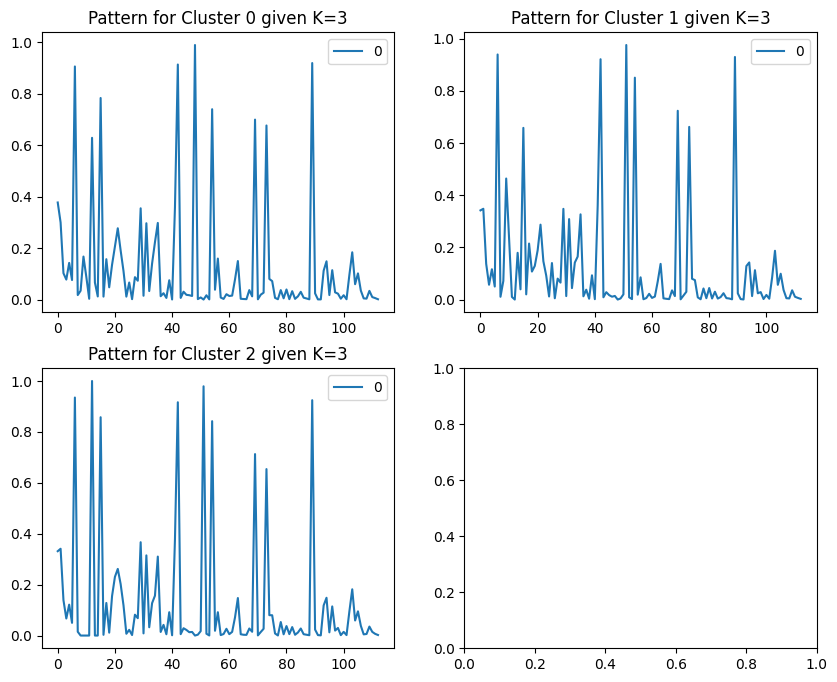

In [159]:
kmeans_clustering(3, df_kmeans)

The total error when K=5 is 75276.45851801289.


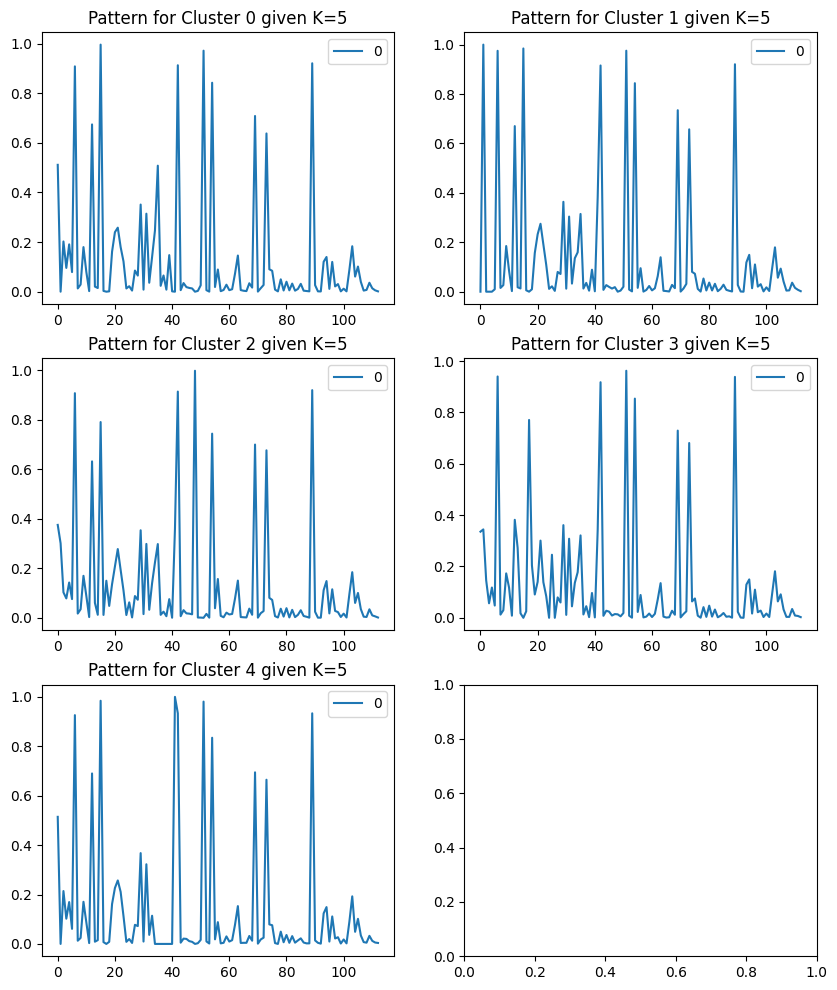

In [160]:
kmeans_clustering(5, df_kmeans)

The total error when K=200 is 50573.32917075244.


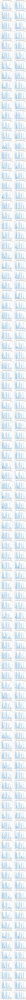

In [161]:
kmeans_clustering(200, df_kmeans)

# **Evaluation**

## Loss Graph

In [38]:
import statistics as st

for f in range(0,k):
    print("Loss of Fold {}: {}".format(f, st.mean(losses[f])))
    print("Accuracy of Fold {}: {}".format(f, st.mean(accuracies[f])))
    print("--------")

# Flatten all losses and accuracies
flat_losses = [item for f_loss in losses for item in f_loss]
flat_accuracies = [item for f_acc in accuracies for item in f_acc]

print("Final Loss: {}".format(flat_losses[-1]))
print("Final Accuracy: {}".format(flat_accuracies[-1]))

Loss of Fold 0: 1.0872745394249346
Accuracy of Fold 0: 0.43626623376623375
--------
Loss of Fold 1: 1.0716608620881671
Accuracy of Fold 1: 0.384185952090946
--------
Loss of Fold 2: 1.0627461598322874
Accuracy of Fold 2: 0.37030856678846935
--------
Loss of Fold 3: 1.0994889568544275
Accuracy of Fold 3: 0.15889971579374745
--------
Loss of Fold 4: 1.074381252175341
Accuracy of Fold 4: 0.36232237109216403
--------
Final Loss: 1.0655566513792307
Final Accuracy: 0.5075111652456354


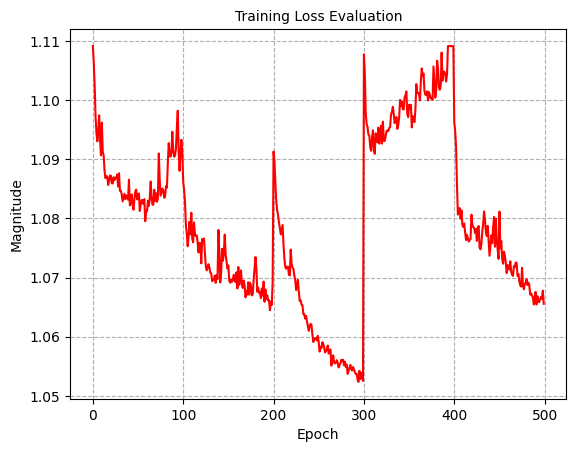

In [39]:
# Plot losses
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
plt.plot(flat_losses, color='red')
plt.title('Training Loss Evaluation', fontsize=10)
ax.set_xticks([x*epochs for x in range(0,k+1)])
ax.set_xticklabels([x*epochs for x in range(0,k+1)])
ax.grid(True, linestyle='--')
plt.xlabel('Epoch', fontsize=10)
plt.ylabel('Magnitude', fontsize=10)
plt.show()

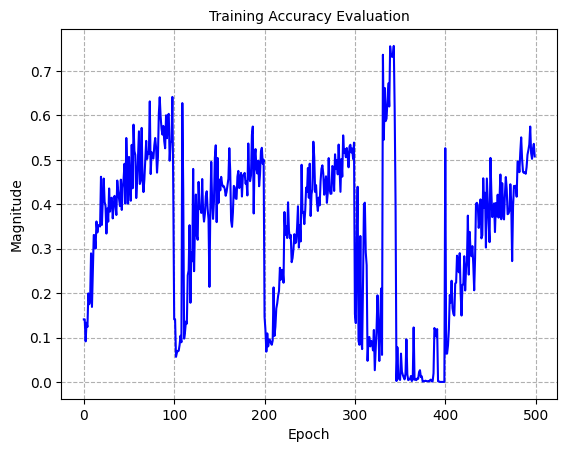

In [40]:
# Plot accuracies
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
plt.plot(flat_accuracies, color='blue')
plt.title('Training Accuracy Evaluation', fontsize=10)
ax.set_xticks([x*epochs for x in range(0,k+1)])
ax.set_xticklabels([x*epochs for x in range(0,k+1)])
plt.xlabel('Epoch', fontsize=10)
plt.ylabel('Magnitude', fontsize=10)
ax.grid(True, linestyle='--')
plt.show()

## Confusion Matrix

In [90]:
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import classification_report
import math 

In [91]:
detached_predictions = predictions.detach().numpy().ravel()

In [92]:
cm = confusion_matrix(y_test.ravel(),detached_predictions)
tp = cm[0][0]
tn = cm[1][1]
fp = cm[0][1]
fn = cm[1][0]

In [94]:
mcc = ((tn * tp) - (fn * fp)) / math.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
f1 = tp / (tp + (0.5 * (fp + fn)))

print(classification_report(y_test.ravel(), detached_predictions))
print("MCC: {}".format(mcc))
print("F1: {}".format(f1))

              precision    recall  f1-score   support

         0.0       0.75      0.75      0.75      4926
         1.0       0.51      0.51      0.51      2463

    accuracy                           0.67      7389
   macro avg       0.63      0.63      0.63      7389
weighted avg       0.67      0.67      0.67      7389

MCC: 0.2612667478684531
F1: 0.7537555826228177


### What was the rational/s behind the design of your model?
Majority of the network's architecture was derived from the hyperparameter optimization function, which returned the optimal batch size, learning rate, hidden layer count, and neuron count given MLPClassifier() and these best parameters were used to construct the custom neural network. The group also decided to use leaky RELU as RELU has been known to be the best activation function compared to other functions.
### What was the rational/s behind the improvements or other techniques used?
Through the course of the project, there were times when certain functions either returned the wrong or repeated values, didn’t perform as was expected or required further study to utilize. With all these in mind, the improvements made to the neural network must address these issues encountered previously while also remaining familiar with the project group and perform exceptionally well regardless of what dataset was used. While the group could have also used data generation, we believe that there was enough data to train the model, and that we could use class weights to rectify the differences in the amount of rows per each accident severity type.
### What feature relevance technique did you use and why do you think it was useful to the improvement of your model? (answer objectively instead of descriptively)
A random forest classifier was used to rank the feature importances of the dataset and the least relevant features were removed. It was noted that after 86 features, the feature importance started to stay constant at a specifically low number. Hence, the group decided to cut off the remaining features as we believe it simply created more noise. The RandomForestClassifier was used due to the size of the dataset.
### What were the main challenges you encountered in terms of creating the model and coming up with your results?
The main challenge when it came to creating the model came to choosing the hyperparameters, as the hyperparameters always changed with every run. Each time, it deviated from its previous answer, despite us keeping the dataset the same. In light of this, we decided to go with the average answer it gave us throughout multiple iterations, which took extremely long. Training the model also took long as we realized the 20 epochs was not enough per each fold, hence, we decided to go with 100 epochs per each fold. Finally, we ended on a model with 50% accuracy, however, our previous tests were able to reach a final accuracy of 78% at one time. We were also not sure how to accomplish feature relevance given that most of the data given to us were qualitative, meaning that we had to convert the qualitative data into quantities. In light of this, the group researched on different methods and found that the RandomForestClassifier helped us understand which features did not have much relevance on the model. 

